# Подготовка данных для построения моделей

In [1]:
#импорт библиотек
import warnings
warnings.filterwarnings("ignore") # отключаем предупреждения

import numpy as np #для матричных вычислений
import pandas as pd #для анализа и предобработки данных
import matplotlib.pyplot as plt #для визуализации
import seaborn as sns #для визуализации
import squarify # для упрощения создания диаграммы treemap

from sklearn import linear_model #линейные модели
from sklearn.linear_model import * #линейные модели
from sklearn.ensemble import * #ансамбли
from sklearn.model_selection import GridSearchCV #подбор гиперпараметров
from sklearn import metrics #метрики
from sklearn import preprocessing #предобработка
from sklearn.model_selection import train_test_split #сплитование выборки
import category_encoders as ce # для работы с кодировщиком
import optuna # для оптимизации гиперпараметров
import xgboost # модели
from xgboost import XGBRegressor # модели
from catboost import CatBoostRegressor # модели
from sklearn.feature_selection import SelectKBest, f_regression # выбор параметров на основе фильтров
%matplotlib inline
plt.style.use('seaborn')

In [2]:
#читаем данные
data = pd.read_csv('data_EDA.csv')
data.head()

,status,propertyType,baths,fireplace,city,sqft,beds,stories,PrivatePool,target,street_type,Year built,Remodeled year,Heating,Cooling,Parking,schools_mean_rate,schools_median_dist,schools_allow_education
0,sale,small_house,4.0,1,other,2900.0,4,no info,0,418000.0,lane,4-13 years,no info,other,no info,no info,5.200000,3.80,all
1,sale,small_house,3.0,no info,low,1947.0,3,2,0,310000.0,avenue,4-13 years,no info,no info,no info,no info,4.000000,1.32,all
2,sale,small_house,2.0,yes,million,3000.0,3,1,1,2895000.0,road,old,long time ago,forced air,central,attached garage,6.666667,2.06,-1
3,sale,small_house,>4,yes,million,6457.0,5,3,0,2395000.0,avenue,14-23 years,14-23 years,forced air,central,detached garage,9.250000,0.93,all
4,sale,townhouse,2.0,no info,million,897.0,2,2,0,209000.0,street,old,no info,forced air,central,no info,5.166667,1.50,all


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 328423 entries, 0 to 328422
Data columns (total 19 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   status                   328423 non-null  object 
 1   propertyType             328423 non-null  object 
 2   baths                    328423 non-null  object 
 3   fireplace                328423 non-null  object 
 4   city                     328423 non-null  object 
 5   sqft                     328423 non-null  float64
 6   beds                     328423 non-null  object 
 7   stories                  328423 non-null  object 
 8   PrivatePool              328423 non-null  int64  
 9   target                   328423 non-null  float64
 10  street_type              328423 non-null  object 
 11  Year built               328423 non-null  object 
 12  Remodeled year           328423 non-null  object 
 13  Heating                  328423 non-null  object 
 14  Cool

In [127]:
# обозначим столбцы для кодировки
#cat_cols = ['status','propertyType','baths','fireplace','city','beds','stories','street_type','Year built','Remodeled year','Heating','Cooling','Parking','schools_allow_education']

#df = data[cat_cols].copy()

# закодируем столбцы
#for col in cat_cols:
#    df[col] = df[col].astype('category').cat.codes
    
#df.head()

,status,propertyType,baths,fireplace,city,beds,stories,street_type,Year built,Remodeled year,Heating,Cooling,Parking,schools_allow_education
0,5,6,4,0,4,3,9,6,4,7,5,1,3,5
1,5,6,3,5,1,2,1,1,4,7,3,1,3,5
2,5,6,5,7,3,4,2,1,1,1,1,0,2,5
3,5,7,2,5,3,1,1,9,7,7,1,0,3,5
4,5,5,2,5,4,7,0,4,1,1,0,0,3,0


In [4]:
# обозначим столбцы для кодировки
#cat_cols = ['status','propertyType','baths','fireplace','city','beds','stories','street_type','Year built','Remodeled year','Heating','Cooling','Parking','schools_allow_education']

# закодируем столбцы
#for col in cat_cols:
#    data[col] = data[col].astype('category').cat.codes
    
#data.head()

,status,propertyType,baths,fireplace,city,sqft,beds,stories,PrivatePool,target,street_type,Year built,Remodeled year,Heating,Cooling,Parking,schools_count,schools_mean_rate,schools_median_dist,schools_allow_education
0,4,5,4,0,4,2900.0,3,9,0,418000.0,6,4,7,5,1,3,8,5.200000,3.80,5
1,4,5,3,5,1,1947.0,2,1,0,310000.0,1,4,7,3,1,3,3,4.000000,1.32,5
2,4,6,2,5,3,897.0,1,1,0,209000.0,9,7,7,1,0,3,0,5.166667,1.50,5
3,4,4,2,5,4,1507.0,7,0,0,181500.0,4,1,1,0,0,3,4,2.333333,3.10,0
4,4,4,2,5,5,8750.0,7,9,0,68000.0,5,5,7,3,1,3,3,2.666667,0.70,0


In [129]:
# нормализация числовых признаков
#scaler = preprocessing.MinMaxScaler() # инициализируем метод
#scaler.fit(data[['sqft', 'schools_count','schools_mean_rate','schools_median_dist']]) # обучение
#data[['sqft', 'schools_count','schools_mean_rate','schools_median_dist']] = scaler.transform(data[['sqft', 'schools_count','schools_mean_rate','schools_median_dist']]) # трансофрмация

In [4]:
#Производим кодирование категориальных признаков
dummies_data = pd.get_dummies(data)
dummies_data.head()

,sqft,PrivatePool,target,schools_mean_rate,schools_median_dist,status_auction,status_backup,status_foreclosure,status_no info,status_sale,...,Parking_detached garage,Parking_no info,Parking_off street,Parking_other,schools_allow_education_-1,schools_allow_education_-2,schools_allow_education_-3,schools_allow_education_-4,schools_allow_education_1,schools_allow_education_all
0,2900.0,0,418000.0,5.200000,3.80,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,1
1,1947.0,0,310000.0,4.000000,1.32,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,1
2,3000.0,1,2895000.0,6.666667,2.06,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
3,6457.0,0,2395000.0,9.250000,0.93,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1
4,897.0,0,209000.0,5.166667,1.50,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,1


In [5]:
# выделим целевой признак
X = dummies_data.drop(['target'], axis=1)
y = dummies_data['target']

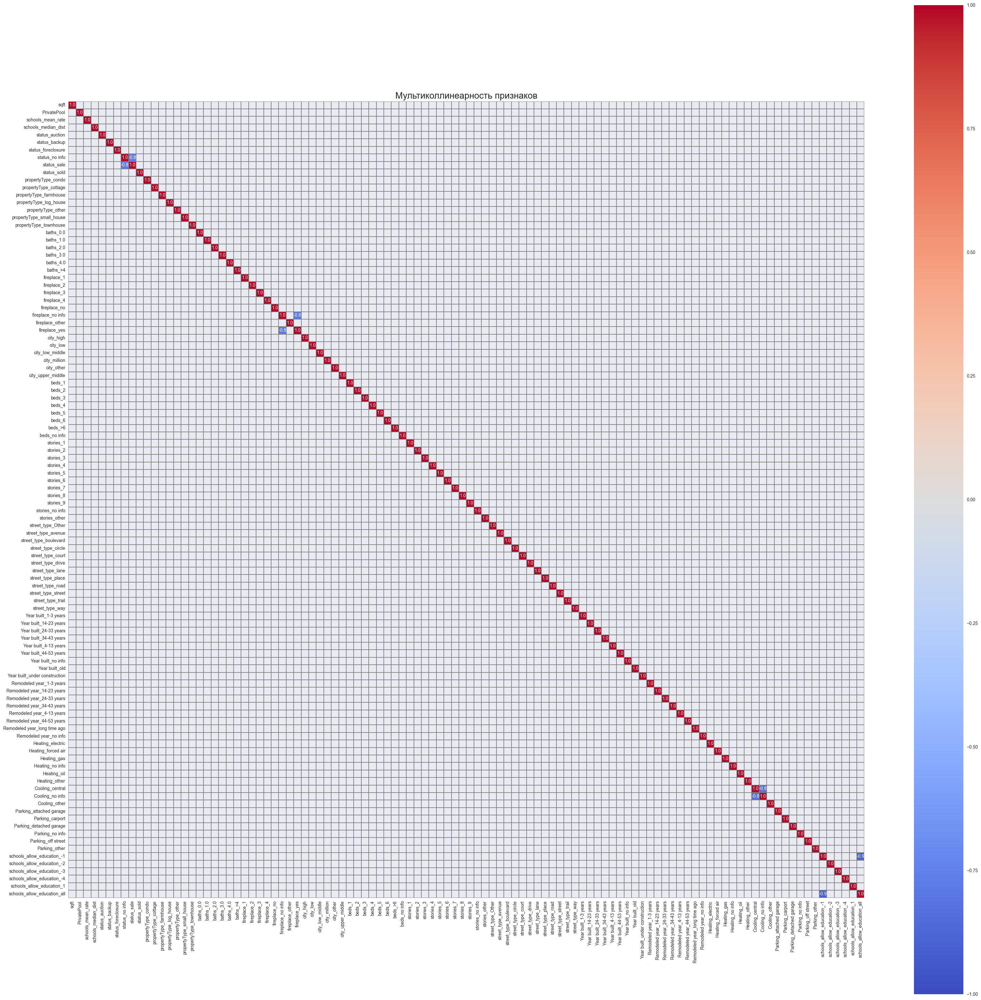

In [6]:
corr = X.corr(method='spearman')

fig, ax = plt.subplots(figsize=(40, 40))
sns.heatmap(
    corr[corr.abs() >= 0.7],
    vmin=-1, 
    vmax=1, 
    linewidth=0.1, 
    linecolor='gray', 
    cmap='coolwarm',
    annot = True,
    fmt='.1f',
    square=True) # включаем отображение коэффициентов

# задаём заголовок
ax.set_title('Мультиколлинеарность признаков', fontsize=20);

In [7]:
# удалим признаки с сильной корреляцией
X = X.drop(['fireplace_no info','Cooling_no info','schools_allow_education_-1'], axis=1)

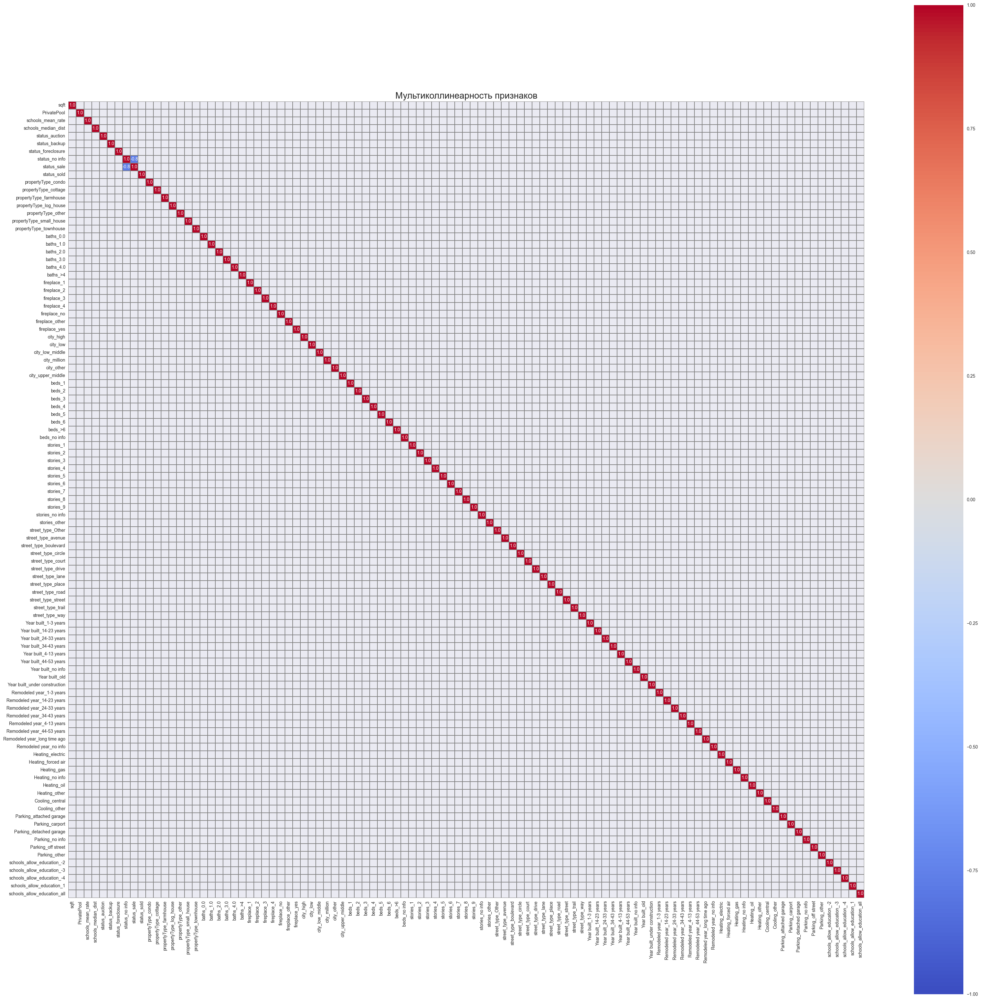

In [8]:
corr = X.corr(method='spearman')

fig, ax = plt.subplots(figsize=(40, 40))
sns.heatmap(
    corr[corr.abs() >= 0.7],
    vmin=-1, 
    vmax=1, 
    linewidth=0.1, 
    linecolor='gray', 
    cmap='coolwarm',
    annot = True,
    fmt='.1f',
    square=True) # включаем отображение коэффициентов

# задаём заголовок
ax.set_title('Мультиколлинеарность признаков', fontsize=20);

In [9]:
# зафиксируем сид
random_state = 17

In [10]:
# разбиваем выборку на трейн, валидацию и тест
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [11]:
# проверим размеры данных
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((229896, 103), (229896,), (98527, 103), (98527,))

# Построение моделей

In [12]:
# функция расчета и отображение метрик
def get_metrics(y_train, y_train_predict, y_test, y_test_predict):

    
    r2_train = metrics.r2_score(y_train, y_train_predict)
    mae_train = metrics.mean_absolute_error(y_train, y_train_predict)
    mape_train = metrics.mean_absolute_percentage_error(y_train, y_train_predict)*100
    
    r2_test = metrics.r2_score(y_test, y_test_predict)
    mae_test = metrics.mean_absolute_error(y_test, y_test_predict)
    mape_test = metrics.mean_absolute_percentage_error(y_test, y_test_predict)*100
    
    
    print(f"Train R2 score: {r2_train:0.2f}")
    print(f"Train MAE: {mae_train:0.2f}")
    print(f"Train MAPE: {mape_train:0.2f}%")
    print()
    print(f"Test R2 score: {r2_test:0.2f}")
    print(f"Test MAE: {mae_test:0.2f}")
    print(f"Test MAPE: {mape_test:0.2f}%")
    
    
    # добавим метрики в списки
    r2_train_list.append(r2_train)
    mae_train_list.append(mae_train)
    mape_train_list.append(mape_train)
    r2_test_list.append(r2_test)
    mae_test_list.append(mae_test)
    mape_test_list.append(mape_test)

In [13]:
# списки для хранения метрик
model_name_list=[]
model_params_list=[]

r2_train_list=[]
mae_train_list=[]
mape_train_list=[]

r2_test_list=[]
mae_test_list=[]
mape_test_list=[]

In [14]:
# функция для вывода весов признаков в моделях
def show_weights(features, weights, scales):
    fig, axs = plt.subplots(figsize=(14, 17), ncols=2)
    sorted_weights = sorted(zip(weights, features, scales), reverse=True)
    weights = [x[0] for x in sorted_weights]
    features = [x[1] for x in sorted_weights]
    scales = [x[2] for x in sorted_weights]
    sns.barplot(y=features, x=weights, ax=axs[0], orient='h')
    axs[0].set_xlabel("Weight")
    sns.barplot(y=features, x=scales, ax=axs[1], orient='h')
    axs[1].set_xlabel("Scale")
    plt.tight_layout()

### Baseline

In [15]:
y_pred_base = y_train.mean()

y_train_pred_base = [y_pred_base for x in range(len(y_train))]
y_test_pred_base = [y_pred_base for x in range(len(y_test))]

In [16]:
get_metrics(y_train, y_train_pred_base, y_test, y_test_pred_base)

model_name_list.append('naive mean')
model_params_list.append('none')

Train R2 score: 0.00
Train MAE: 407523.93
Train MAPE: 142.31%

Test R2 score: -0.00
Test MAE: 407487.58
Test MAPE: 143.33%


### LinearRegression

In [17]:
%%time

lr = LinearRegression(n_jobs=-1)
lr.fit(X_train, y_train)

y_train_pred_lr = lr.predict(X_train)
y_test_pred_lr = lr.predict(X_test)

CPU times: total: 10.1 s
Wall time: 1.3 s


In [18]:
get_metrics(y_train, y_train_pred_lr, y_test, y_test_pred_lr)

model_name_list.append('LinearRegression')
model_params_list.append('none')

Train R2 score: 0.46
Train MAE: 281941.64
Train MAPE: 76.04%

Test R2 score: 0.46
Test MAE: 282736.49
Test MAPE: 76.59%


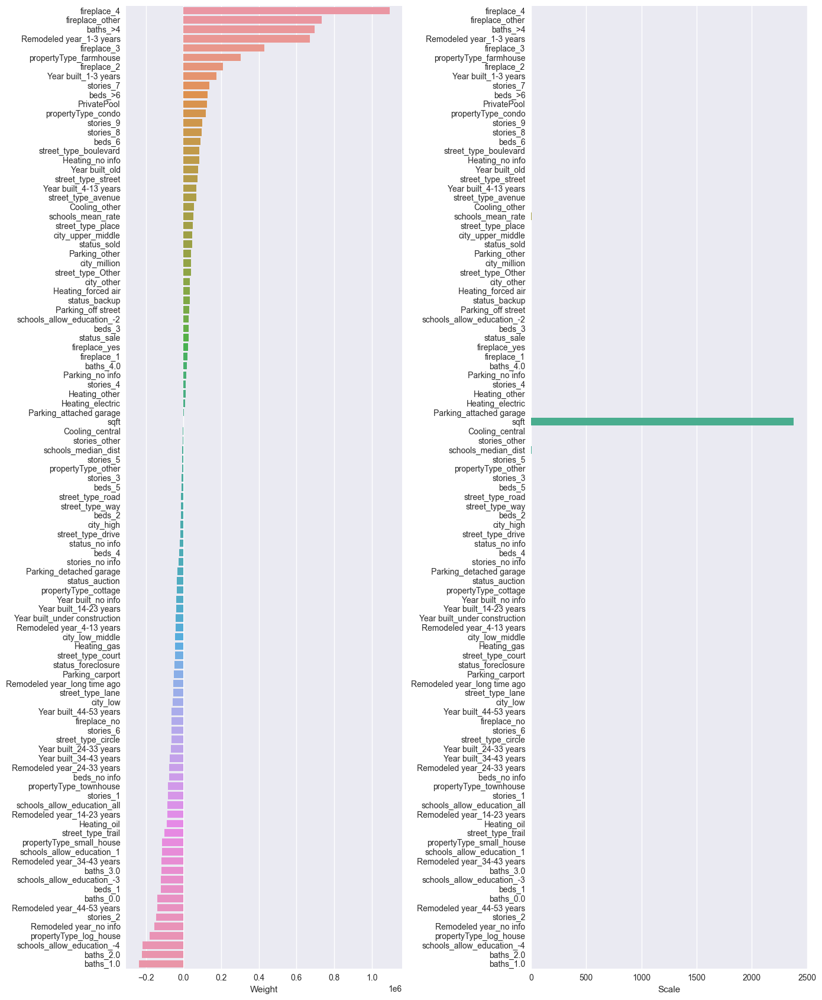

In [19]:
show_weights(X.columns, lr.coef_, X_train.std())

### RandomForest

In [20]:
%%time

rf = RandomForestRegressor(random_state=random_state)
rf.fit(X_train, y_train)

y_train_pred_rf = rf.predict(X_train)
y_test_pred_rf = rf.predict(X_test)

CPU times: total: 4min 30s
Wall time: 4min 33s


In [21]:
get_metrics(y_train, y_train_pred_rf, y_test, y_test_pred_rf)

model_name_list.append('RandomForestRegressor')
model_params_list.append('none')

Train R2 score: 0.96
Train MAE: 65963.49
Train MAPE: 15.59%

Test R2 score: 0.72
Test MAE: 176281.42
Test MAPE: 42.03%


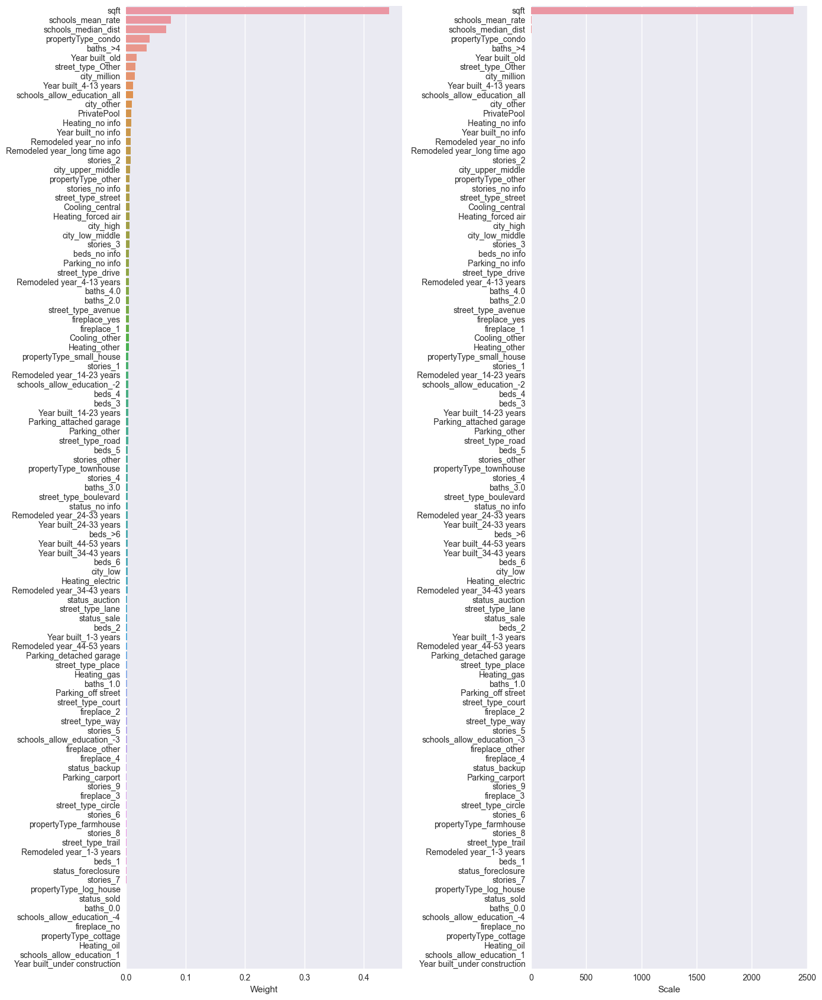

In [22]:
show_weights(X.columns, rf.feature_importances_, X_train.std())

In [23]:
def optuna_rf(trial):
    # задаем пространства поиска гиперпараметров
    n_estimators = trial.suggest_int('n_estimators', 100, 200, 1)
    max_depth = trial.suggest_int('max_depth', 3, 30, 1)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 5, 20, 1)
    min_samples_split = trial.suggest_int('min_samples_split', 5, 20, 1)

    # создаем модель
    model = RandomForestRegressor(n_estimators=n_estimators,
                                  max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  min_samples_split=min_samples_split,
                                  random_state=random_state)
    # обучаем модель
    model.fit(X_train, y_train)
    score = metrics.r2_score(y_train, model.predict(X_train))

    return score

In [24]:
%%time
# cоздаем объект исследования
# можем напрямую указать, что нам необходимо максимизировать метрику direction="maximize"
rf_optuna = optuna.create_study(study_name="RandomForestRegressor", direction="maximize")
# ищем лучшую комбинацию гиперпараметров n_trials раз
rf_optuna.optimize(optuna_rf, n_trials=20)

[I 2023-08-24 18:18:41,324] A new study created in memory with name: RandomForestRegressor
[I 2023-08-24 18:21:59,024] Trial 0 finished with value: 0.7359370731223687 and parameters: {'n_estimators': 112, 'max_depth': 17, 'min_samples_leaf': 13, 'min_samples_split': 15}. Best is trial 0 with value: 0.7359370731223687.
[I 2023-08-24 18:26:32,628] Trial 1 finished with value: 0.7919243762912528 and parameters: {'n_estimators': 137, 'max_depth': 27, 'min_samples_leaf': 8, 'min_samples_split': 8}. Best is trial 1 with value: 0.7919243762912528.
[I 2023-08-24 18:27:57,374] Trial 2 finished with value: 0.4909415663834521 and parameters: {'n_estimators': 148, 'max_depth': 5, 'min_samples_leaf': 11, 'min_samples_split': 5}. Best is trial 1 with value: 0.7919243762912528.
[I 2023-08-24 18:33:21,560] Trial 3 finished with value: 0.7804341488784817 and parameters: {'n_estimators': 166, 'max_depth': 30, 'min_samples_leaf': 9, 'min_samples_split': 11}. Best is trial 1 with value: 0.7919243762912528

CPU times: total: 1h 29min 1s
Wall time: 1h 29min 19s


In [25]:
# выводим результаты на обучающей выборке
print("Наилучшие значения гиперпараметров {}".format(rf_optuna.best_params))
print("r2_score на обучающем наборе: {:.2f}".format(rf_optuna.best_value))

Наилучшие значения гиперпараметров {'n_estimators': 180, 'max_depth': 20, 'min_samples_leaf': 5, 'min_samples_split': 11}
r2_score на обучающем наборе: 0.83


In [26]:
# график истории оптимизации
optuna.visualization.plot_optimization_history(rf_optuna, target_name="r2_score")

In [27]:
# график важности гиперпараметров
optuna.visualization.plot_param_importances(rf_optuna, target_name="r2_score")

In [28]:
# рассчитаем точность для тестовой выборки
model = RandomForestRegressor(**rf_optuna.best_params,
                              random_state=random_state)
model.fit(X_train, y_train)
y_train_pred_rf_optuna_best = model.predict(X_train)
print("accuracy на тестовом наборе: {:.2f}".format(model.score(X_test, y_test)))
y_test_pred_rf_optuna_best = model.predict(X_test)
print('r2_score на тестовом наборе: {:.2f}'.format(metrics.r2_score(y_test, y_test_pred_rf_optuna_best)))

accuracy на тестовом наборе: 0.69
r2_score на тестовом наборе: 0.69


In [29]:
get_metrics(y_train, y_train_pred_rf_optuna_best, y_test, y_test_pred_rf_optuna_best)

model_name_list.append('RandomForestRegressor')
model_params_list.append(str(rf_optuna.best_params))

Train R2 score: 0.83
Train MAE: 145153.91
Train MAPE: 36.47%

Test R2 score: 0.69
Test MAE: 190427.13
Test MAPE: 46.26%


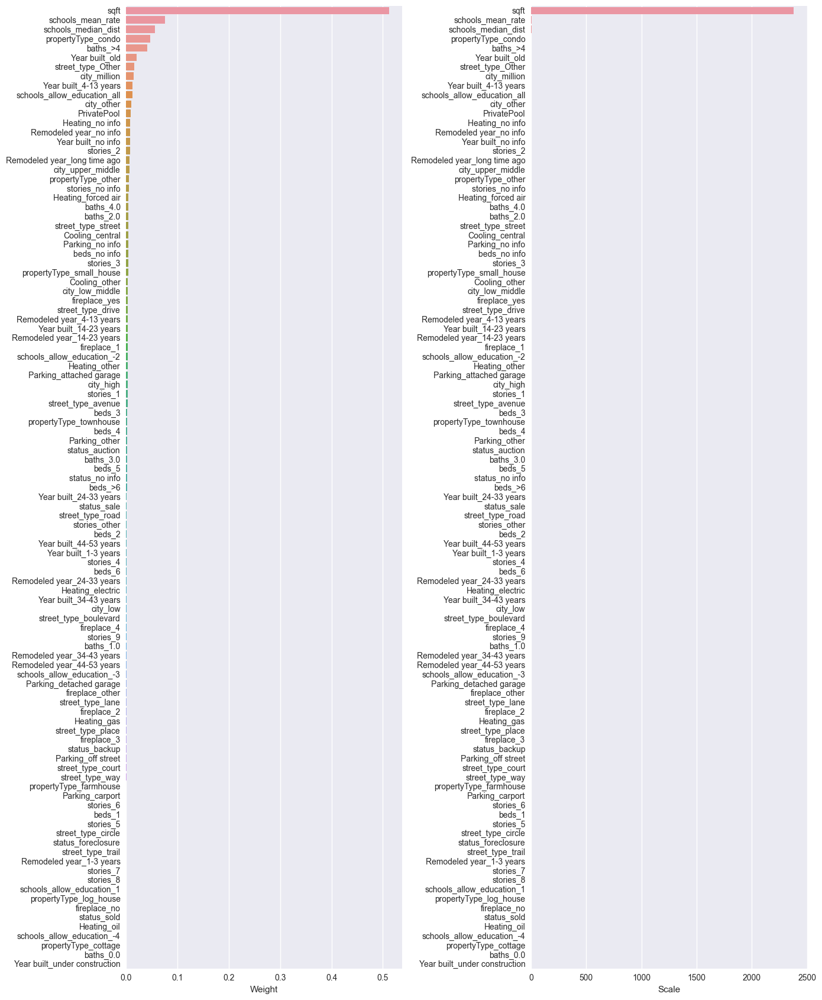

In [30]:
show_weights(X.columns, model.feature_importances_, X_train.std())

Попробуем некоторые пользовательские параметры, чтобы снизить переобученность

In [31]:
# рассчитаем точность для тестовой выборки
model = RandomForestRegressor(n_estimators=150,
                              max_depth=17, 
                              min_samples_leaf=8, 
                              min_samples_split=15,
                              random_state=random_state)
model.fit(X_train, y_train)
y_train_pred_rf_optuna = model.predict(X_train)
print("accuracy на тестовом наборе: {:.2f}".format(model.score(X_test, y_test)))
y_test_pred_rf_optuna = model.predict(X_test)
print('r2_score на тестовом наборе: {:.2f}'.format(metrics.r2_score(y_test, y_test_pred_rf_optuna)))

accuracy на тестовом наборе: 0.68
r2_score на тестовом наборе: 0.68


In [32]:
get_metrics(y_train, y_train_pred_rf_optuna, y_test, y_test_pred_rf_optuna)

model_name_list.append('RandomForestRegressor')
model_params_list.append(str({'n_estimators': 150, 'max_depth': 17, 'min_samples_leaf': 8, 'min_samples_split': 15}))

Train R2 score: 0.77
Train MAE: 170260.73
Train MAPE: 43.39%

Test R2 score: 0.68
Test MAE: 199368.34
Test MAPE: 49.36%


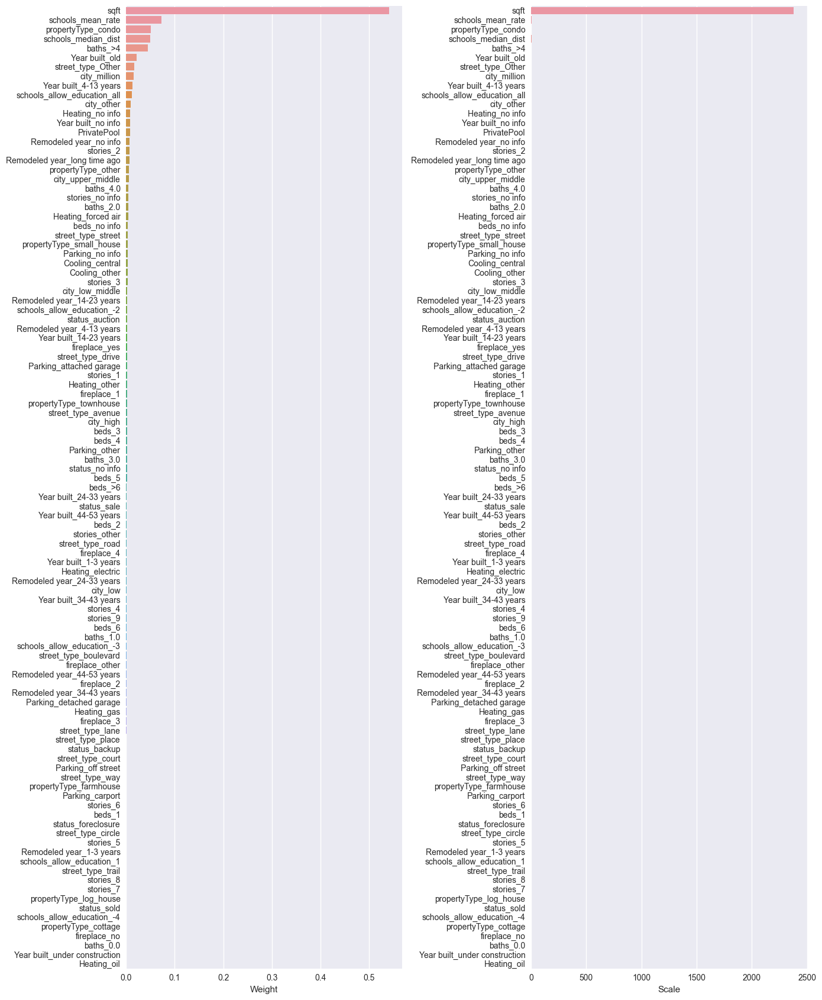

In [33]:
show_weights(X.columns, model.feature_importances_, X_train.std())

In [34]:
# рассчитаем точность для тестовой выборки
model = RandomForestRegressor(n_estimators=200,
                              max_depth=18, 
                              min_samples_leaf=7, 
                              min_samples_split=15,
                              random_state=random_state)
model.fit(X_train, y_train)
y_train_pred_rf_optuna_2 = model.predict(X_train)
print("accuracy на тестовом наборе: {:.2f}".format(model.score(X_test, y_test)))
y_test_pred_rf_optuna_2 = model.predict(X_test)
print('r2_score на тестовом наборе: {:.2f}'.format(metrics.r2_score(y_test, y_test_pred_rf_optuna_2)))

accuracy на тестовом наборе: 0.68
r2_score на тестовом наборе: 0.68


In [35]:
get_metrics(y_train, y_train_pred_rf_optuna_2, y_test, y_test_pred_rf_optuna_2)

model_name_list.append('RandomForestRegressor')
model_params_list.append(str({'n_estimators': 200, 'max_depth': 18, 'min_samples_leaf': 7, 'min_samples_split': 15}))

Train R2 score: 0.79
Train MAE: 162954.62
Train MAPE: 41.24%

Test R2 score: 0.68
Test MAE: 196268.92
Test MAPE: 48.24%


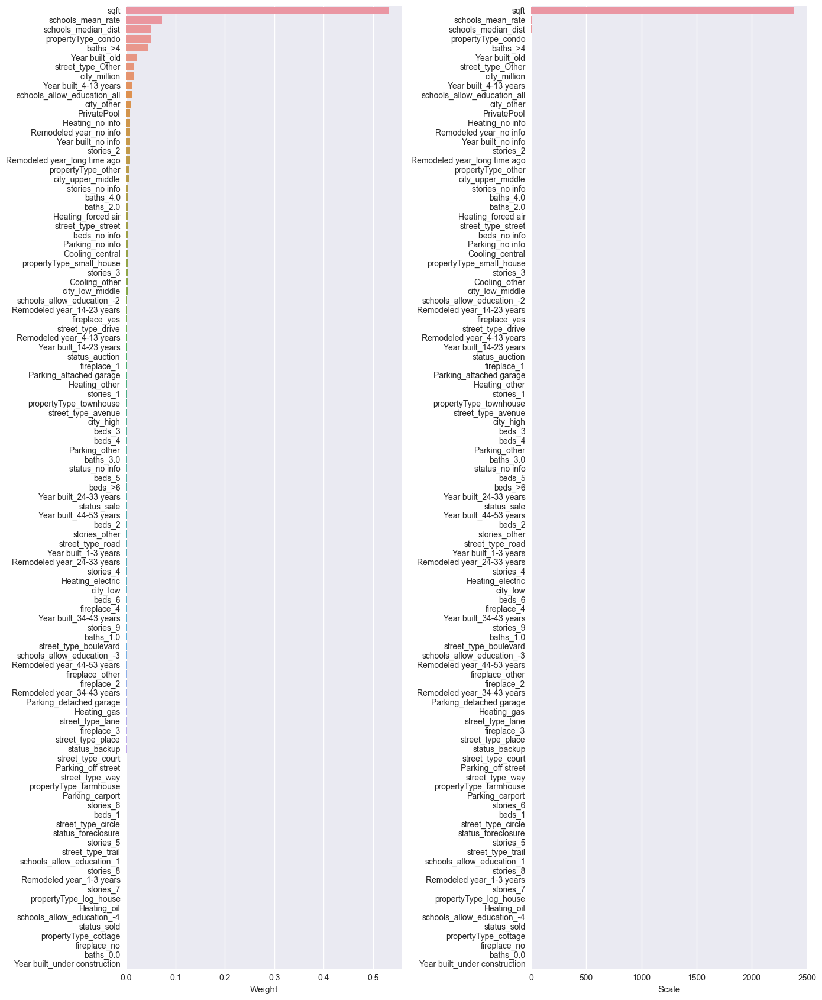

In [36]:
show_weights(X.columns, model.feature_importances_, X_train.std())

### GradientBoosting

In [37]:
def optuna_gb(trial):
    # задаем пространства поиска гиперпараметров
    max_depth = trial.suggest_int('max_depth', 10, 20, 1)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 5, 15, 1)
    min_samples_split = trial.suggest_int('min_samples_split', 5, 20, 1)

    # создаем модель
    model = GradientBoostingRegressor(max_depth=max_depth,
                                      min_samples_leaf=min_samples_leaf,
                                      min_samples_split=min_samples_split,
                                      random_state=random_state)
    # обучаем модель
    model.fit(X_train, y_train)
    score = metrics.r2_score(y_train, model.predict(X_train))

    return score

In [38]:
%%time
# cоздаем объект исследования
# можем напрямую указать, что нам необходимо максимизировать метрику direction="maximize"
gb_optuna = optuna.create_study(study_name="GradientBoostingRegressor", direction="maximize")
# ищем лучшую комбинацию гиперпараметров n_trials раз
gb_optuna.optimize(optuna_gb, n_trials=20)

[I 2023-08-24 20:18:04,669] A new study created in memory with name: GradientBoostingRegressor
[I 2023-08-24 20:22:11,286] Trial 0 finished with value: 0.9283956922543973 and parameters: {'max_depth': 16, 'min_samples_leaf': 10, 'min_samples_split': 9}. Best is trial 0 with value: 0.9283956922543973.
[I 2023-08-24 20:25:51,850] Trial 1 finished with value: 0.9200452456772732 and parameters: {'max_depth': 14, 'min_samples_leaf': 6, 'min_samples_split': 16}. Best is trial 0 with value: 0.9283956922543973.
[I 2023-08-24 20:31:00,964] Trial 2 finished with value: 0.9857979734470808 and parameters: {'max_depth': 20, 'min_samples_leaf': 5, 'min_samples_split': 5}. Best is trial 2 with value: 0.9857979734470808.
[I 2023-08-24 20:35:25,350] Trial 3 finished with value: 0.9438041697353545 and parameters: {'max_depth': 17, 'min_samples_leaf': 8, 'min_samples_split': 20}. Best is trial 2 with value: 0.9857979734470808.
[I 2023-08-24 20:39:22,438] Trial 4 finished with value: 0.9441781623608428 an

CPU times: total: 1h 24min 50s
Wall time: 1h 25min 32s


In [39]:
# выводим результаты на обучающей выборке
print("Наилучшие значения гиперпараметров {}".format(gb_optuna.best_params))
print("r2_score на обучающем наборе: {:.2f}".format(gb_optuna.best_value))

Наилучшие значения гиперпараметров {'max_depth': 20, 'min_samples_leaf': 5, 'min_samples_split': 5}
r2_score на обучающем наборе: 0.99


In [40]:
# график истории оптимизации
optuna.visualization.plot_optimization_history(gb_optuna, target_name="r2_score")

In [41]:
# график важности гиперпараметров
optuna.visualization.plot_param_importances(gb_optuna, target_name="r2_score")

In [42]:
# рассчитаем точность для тестовой выборки
model_gb = GradientBoostingRegressor(**gb_optuna.best_params,
                                  random_state=random_state)
model_gb.fit(X_train, y_train)
y_train_pred_gb_optuna_best = model_gb.predict(X_train)
print("accuracy на тестовом наборе: {:.2f}".format(model_gb.score(X_test, y_test)))
y_test_pred_gb_optuna_best = model.predict(X_test)
print('r2_score на тестовом наборе: {:.2f}'.format(metrics.r2_score(y_test, y_test_pred_gb_optuna_best)))

accuracy на тестовом наборе: 0.73
r2_score на тестовом наборе: 0.68


In [43]:
get_metrics(y_train, y_train_pred_gb_optuna_best, y_test, y_test_pred_gb_optuna_best)

model_name_list.append('GradientBoostingRegressor')
model_params_list.append(str(gb_optuna.best_params))

Train R2 score: 0.99
Train MAE: 47941.97
Train MAPE: 13.94%

Test R2 score: 0.68
Test MAE: 196268.92
Test MAPE: 48.24%


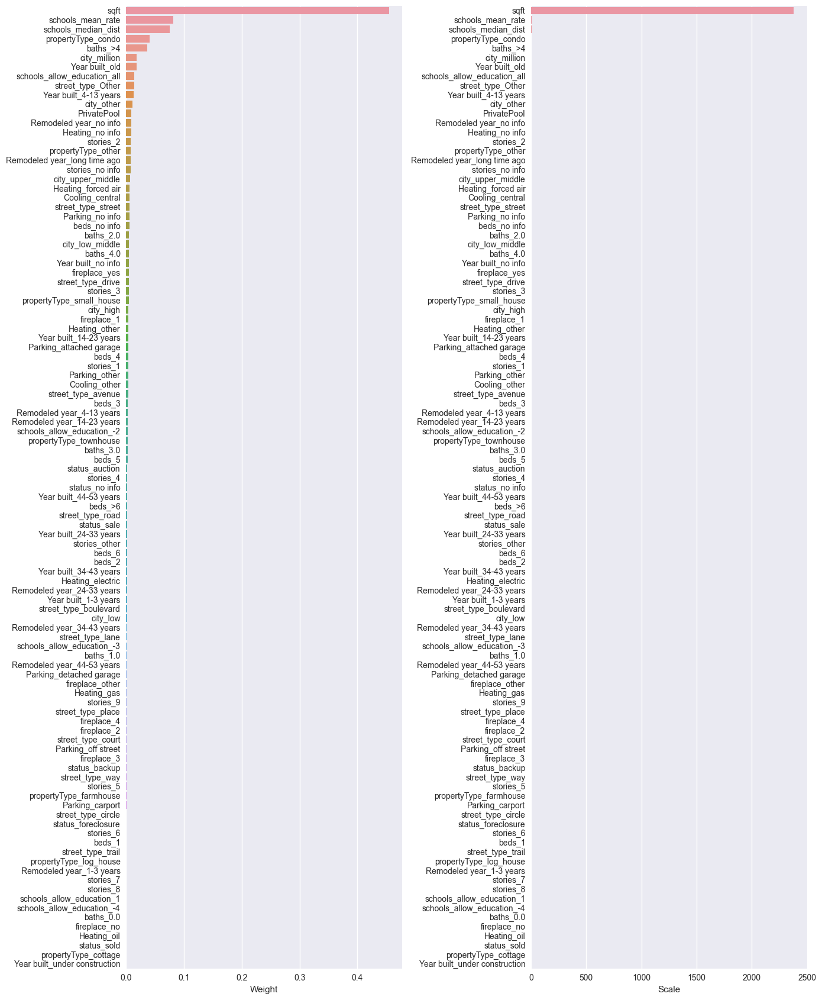

In [44]:
show_weights(X.columns, model_gb.feature_importances_, X_train.std())

Попробуем некоторые пользовательские параметры

In [45]:
# рассчитаем точность для тестовой выборки
model_gb = GradientBoostingRegressor(max_depth=13, 
                                  min_samples_leaf=7, 
                                  min_samples_split=7,
                                  random_state=random_state)
model_gb.fit(X_train, y_train)
y_train_pred_gb_optuna = model_gb.predict(X_train)
print("accuracy на тестовом наборе: {:.2f}".format(model_gb.score(X_test, y_test)))
y_test_pred_gb_optuna = model.predict(X_test)
print('r2_score на тестовом наборе: {:.2f}'.format(metrics.r2_score(y_test, y_test_pred_gb_optuna)))

accuracy на тестовом наборе: 0.74
r2_score на тестовом наборе: 0.68


In [46]:
get_metrics(y_train, y_train_pred_gb_optuna, y_test, y_test_pred_gb_optuna)

model_name_list.append('GradientBoostingRegressor')
model_params_list.append(str({'max_depth': 13, 'min_samples_leaf': 7, 'min_samples_split': 7}))

Train R2 score: 0.90
Train MAE: 122773.63
Train MAPE: 32.98%

Test R2 score: 0.68
Test MAE: 196268.92
Test MAPE: 48.24%


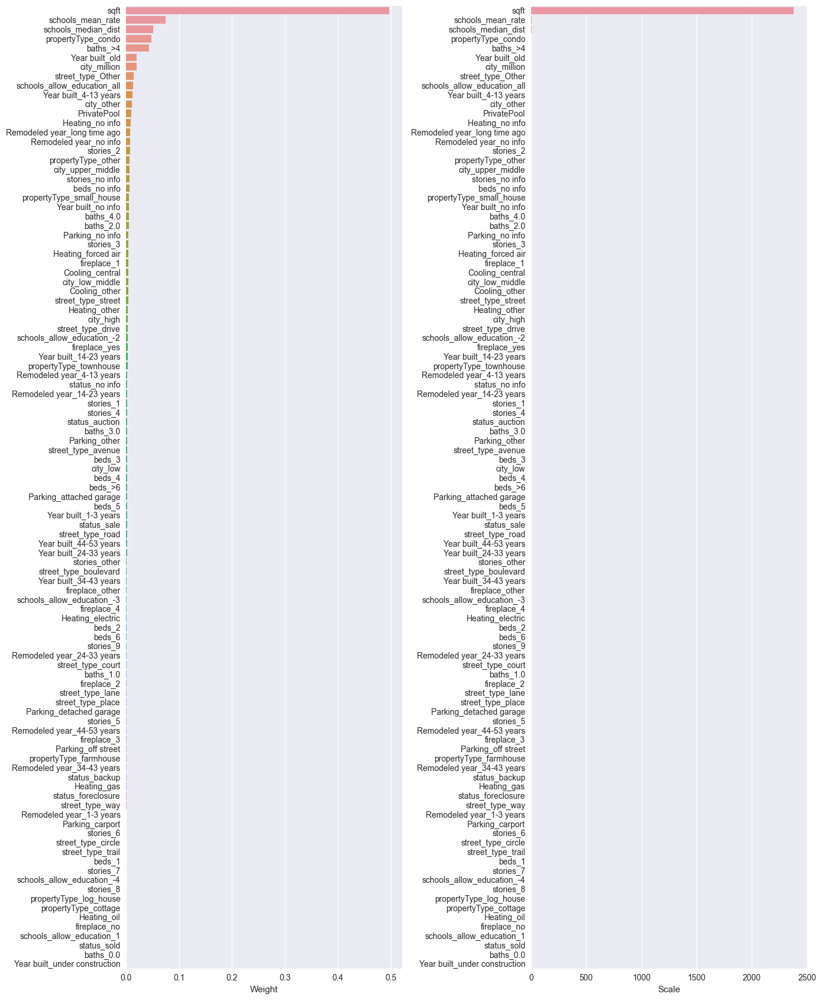

In [48]:
show_weights(X.columns, model_gb.feature_importances_, X_train.std())

In [47]:
# рассчитаем точность для тестовой выборки
model_gb = GradientBoostingRegressor(max_depth=11, 
                                  min_samples_leaf=8, 
                                  random_state=random_state)
model_gb.fit(X_train, y_train)
y_train_pred_gb_optuna = model_gb.predict(X_train)
print("accuracy на тестовом наборе: {:.2f}".format(model_gb.score(X_test, y_test)))
y_test_pred_gb_optuna = model.predict(X_test)
print('r2_score на тестовом наборе: {:.2f}'.format(metrics.r2_score(y_test, y_test_pred_gb_optuna)))

accuracy на тестовом наборе: 0.73
r2_score на тестовом наборе: 0.68


In [49]:
get_metrics(y_train, y_train_pred_gb_optuna, y_test, y_test_pred_gb_optuna)

model_name_list.append('GradientBoostingRegressor')
model_params_list.append(str({'max_depth': 11, 'min_samples_leaf': 8}))

Train R2 score: 0.85
Train MAE: 151671.70
Train MAPE: 39.64%

Test R2 score: 0.68
Test MAE: 196268.92
Test MAPE: 48.24%


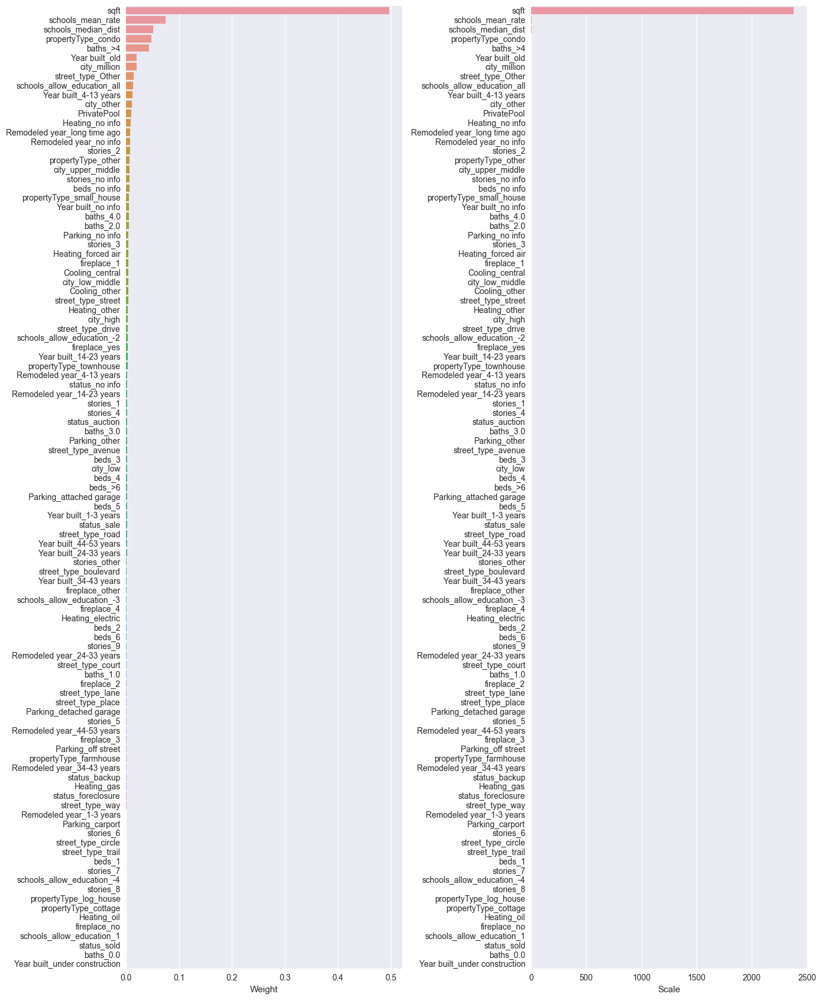

In [50]:
show_weights(X.columns, model_gb.feature_importances_, X_train.std())

In [51]:
# рассчитаем точность для тестовой выборки
model_gb = GradientBoostingRegressor(max_depth=20, 
                                  min_samples_leaf=20, 
                                  random_state=random_state)
model_gb.fit(X_train, y_train)
y_train_pred_gb_optuna = model_gb.predict(X_train)
print("accuracy на тестовом наборе: {:.2f}".format(model_gb.score(X_test, y_test)))
y_test_pred_gb_optuna = model.predict(X_test)
print('r2_score на тестовом наборе: {:.2f}'.format(metrics.r2_score(y_test, y_test_pred_gb_optuna)))

accuracy на тестовом наборе: 0.74
r2_score на тестовом наборе: 0.68


In [52]:
get_metrics(y_train, y_train_pred_gb_optuna, y_test, y_test_pred_gb_optuna)

model_name_list.append('GradientBoostingRegressor')
model_params_list.append(str({'max_depth': 20, 'min_samples_leaf': 20}))

Train R2 score: 0.91
Train MAE: 110210.10
Train MAPE: 27.23%

Test R2 score: 0.68
Test MAE: 196268.92
Test MAPE: 48.24%


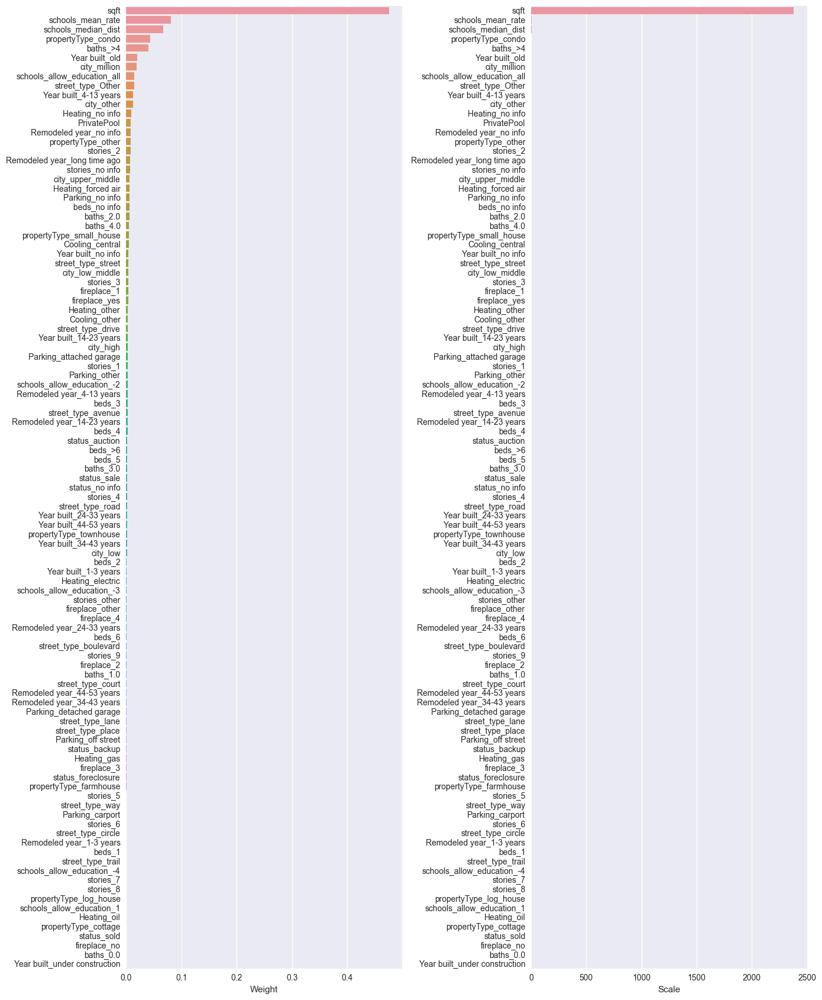

In [53]:
show_weights(X.columns, model_gb.feature_importances_, X_train.std())

### StochasticGradientBoosting

In [ ]:
#Инициализируем объект класса линейная регрессия
sgd = SGDRegressor(random_state=random_state)
#Обучаем модель - ищем параметры
sgd.fit(X_train, y_train)
#Делаем предсказание для каждой из выборок
y_train_pred_sgd = sgd.predict(X_train)
y_test_pred_sgd = sgd.predict(X_test)

In [ ]:
get_metrics(y_train, y_train_pred_sgd, y_test, y_test_pred_sgd)

model_name_list.append('SGDRegressor')
model_params_list.append('none')

Train R2 score: -19466801276137967616.00
Train MAE: 2204648321399469.00
Train MAPE: 624346976238.65%

Test R2 score: -19168243564083904512.00
Test MAE: 2198486130374475.50
Test MAPE: 626323452646.71%


Точно, для SGD необходима нормализация, вернемся к ней позднее

### CatBoost

In [54]:
%%time

ctb = CatBoostRegressor(iterations=5000,
                          random_seed=random_state,
                          eval_metric='R2',
                          custom_metric=['MAPE', 'MAE'],
                          silent=True,
                         )
ctb.fit(X_train, y_train,
         eval_set=(X_test, y_test),
         verbose_eval=0,
         use_best_model=True,
         )

y_train_pred_ctb = ctb.predict(X_train)
y_test_pred_ctb = ctb.predict(X_test)

CPU times: total: 17min 32s
Wall time: 1min 2s


In [55]:
get_metrics(y_train, y_train_pred_ctb, y_test, y_test_pred_ctb)

model_name_list.append('CatBoostRegressor')
model_params_list.append('learning_rate: ' + str(ctb.learning_rate_))

Train R2 score: 0.80
Train MAE: 171610.26
Train MAPE: 42.85%

Test R2 score: 0.73
Test MAE: 187824.59
Test MAPE: 45.22%


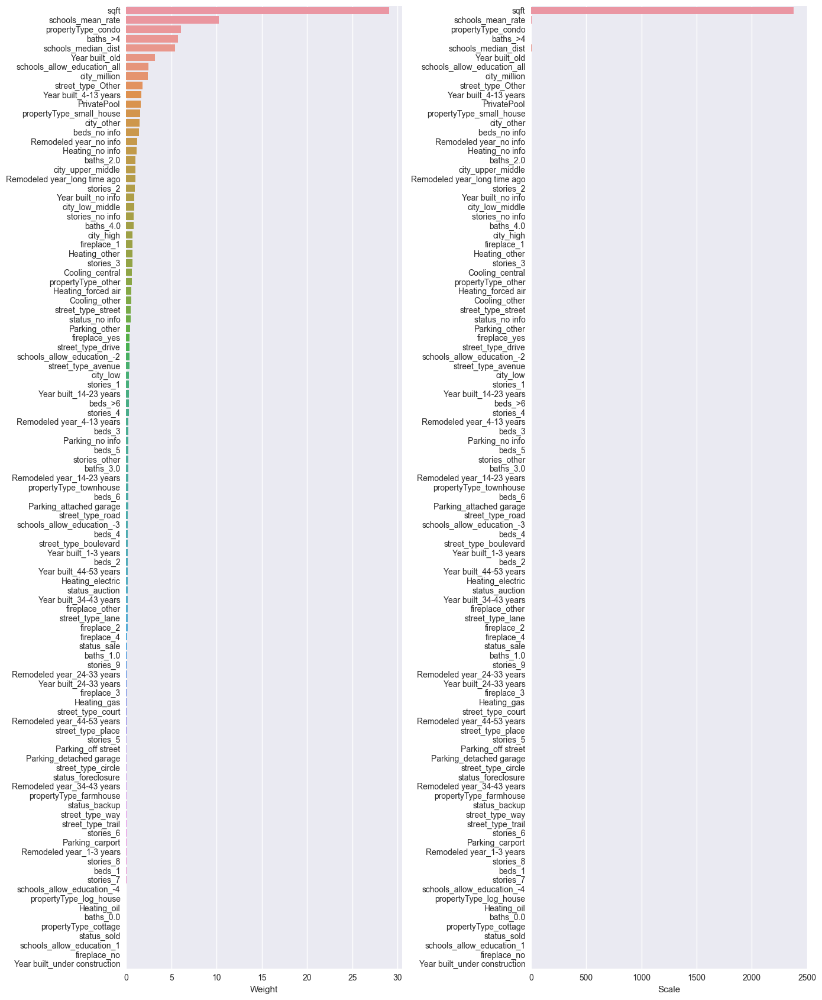

In [56]:
show_weights(X.columns, ctb.feature_importances_, X_train.std())

-------------------
## Попробуем преобразовать признаки

### Начнем с целевого признака

In [69]:
# произведем логарифмирование
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

In [70]:
# создадим список для изменений
y_log_list = []
y_log_list += ['none'] * len(model_name_list) # заполним для предыдущих случаев

In [72]:
%%time

lr = LinearRegression(n_jobs=-1)
lr.fit(X_train, y_train_log)

y_train_log_pred_lr = lr.predict(X_train)
y_test_log_pred_lr = lr.predict(X_test)

CPU times: total: 10.4 s
Wall time: 1.25 s


In [73]:
get_metrics(y_train, np.exp(y_train_log_pred_lr), y_test, np.exp(y_test_log_pred_lr))

model_name_list.append('LinearRegression')
model_params_list.append('none')
y_log_list.append('yes')

Train R2 score: -3.52
Train MAE: 291749.36
Train MAPE: 56.73%

Test R2 score: -3.68
Test MAE: 292134.07
Test MAPE: 57.04%


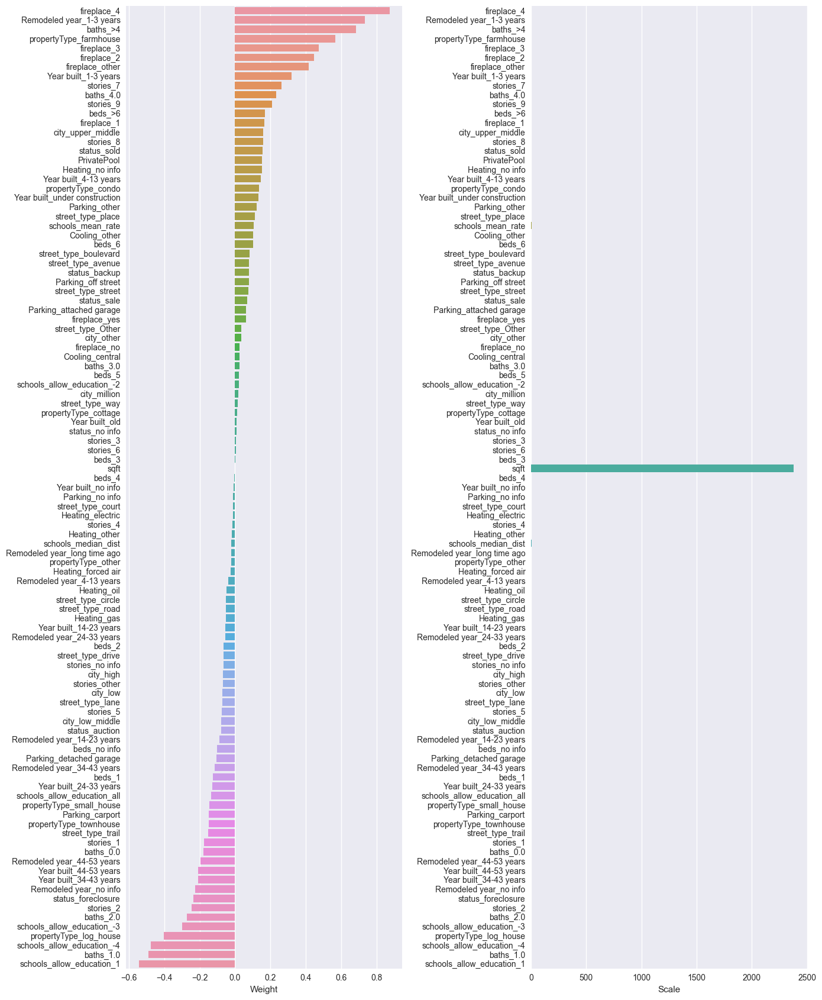

In [74]:
show_weights(X.columns, lr.coef_, X_train.std())

In [75]:
# рассчитаем точность для тестовой выборки
model = RandomForestRegressor(n_estimators=172,
                              max_depth=20, 
                              min_samples_leaf=5, 
                              min_samples_split=11,
                              random_state=random_state)
model.fit(X_train, y_train_log)
y_train_log_pred_rf = model.predict(X_train)
y_test_log_pred_rf = model.predict(X_test)

In [76]:
get_metrics(y_train, np.exp(y_train_log_pred_rf), y_test, np.exp(y_test_log_pred_rf))

model_name_list.append('RandomForestRegressor')
model_params_list.append(str({'n_estimators': 172, 'max_depth': 20, 'min_samples_leaf': 5, 'min_samples_split': 11}))
y_log_list.append('yes')

Train R2 score: 0.78
Train MAE: 140715.64
Train MAPE: 25.90%

Test R2 score: 0.65
Test MAE: 183000.39
Test MAPE: 35.33%


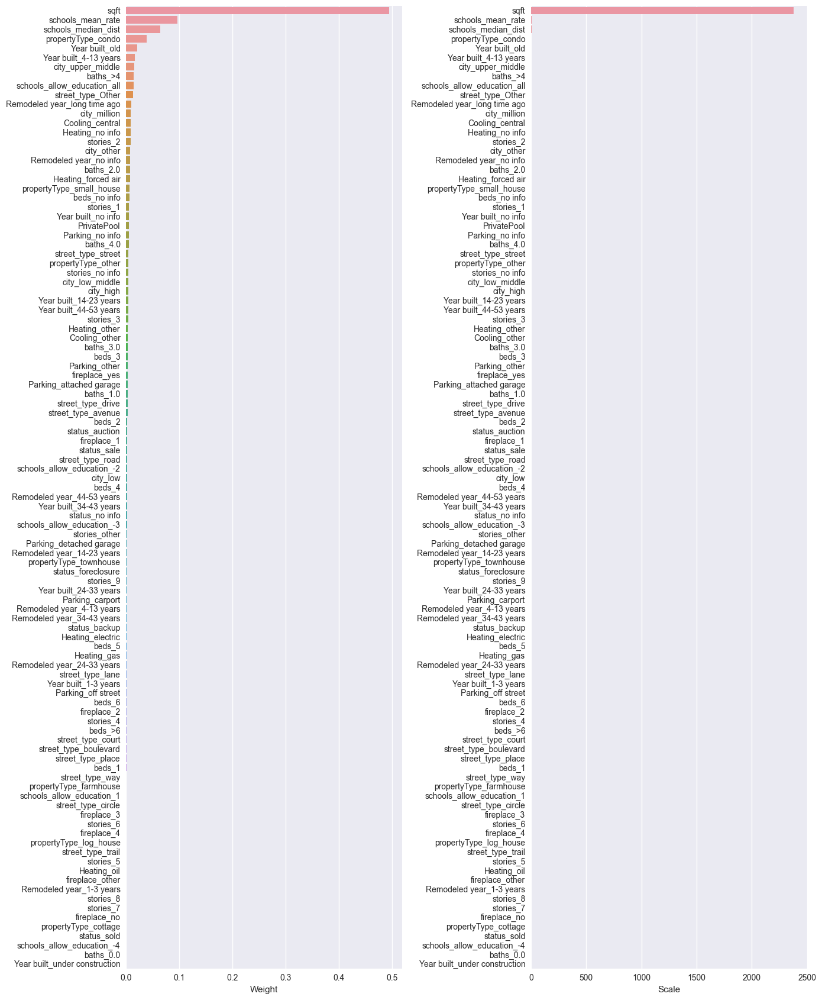

In [77]:
show_weights(X.columns, model.feature_importances_, X_train.std())

In [78]:
# рассчитаем точность для тестовой выборки
model_gb = GradientBoostingRegressor(max_depth=13, 
                                  min_samples_leaf=7, 
                                  min_samples_split=7, 
                                  random_state=random_state)
model_gb.fit(X_train, y_train_log)
y_train_log_pred_gb = model_gb.predict(X_train)
y_test_log_pred_gb = model.predict(X_test)

In [79]:
get_metrics(y_train, np.exp(y_train_log_pred_gb), y_test, np.exp(y_test_log_pred_gb))

model_name_list.append('GradientBoostingRegressor')
model_params_list.append(str({'max_depth': 16, 'min_samples_leaf': 15, 'min_samples_split': 11}))
y_log_list.append('yes')

Train R2 score: 0.85
Train MAE: 121932.48
Train MAPE: 23.33%

Test R2 score: 0.65
Test MAE: 183000.39
Test MAPE: 35.33%


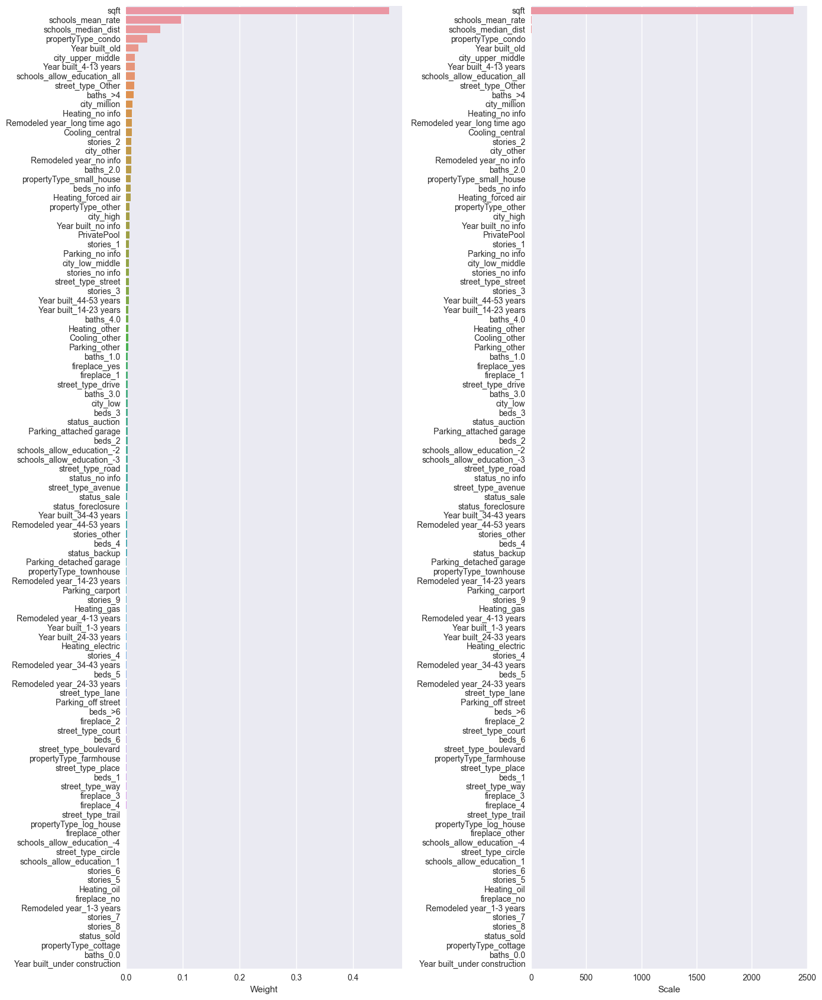

In [80]:
show_weights(X.columns, model_gb.feature_importances_, X_train.std())

In [81]:
%%time

ctb = CatBoostRegressor(iterations=5000,
                          random_seed=random_state,
                          eval_metric='R2',
                          custom_metric=['MAPE', 'MAE'],
                          silent=True,
                         )
ctb.fit(X_train, y_train_log,
         eval_set=(X_test, y_test_log),
         verbose_eval=0,
         use_best_model=True,
         )

y_train_log_pred_ctb = ctb.predict(X_train)
y_test_log_pred_ctb = ctb.predict(X_test)

CPU times: total: 17min 56s
Wall time: 1min 1s


In [82]:
get_metrics(y_train, np.exp(y_train_log_pred_ctb), y_test, np.exp(y_test_log_pred_ctb))

model_name_list.append('CatBoostRegressor')
model_params_list.append('learning_rate: ' + str(ctb.learning_rate_))
y_log_list.append('yes')

Train R2 score: 0.74
Train MAE: 165422.12
Train MAPE: 30.90%

Test R2 score: 0.70
Test MAE: 175389.76
Test MAPE: 33.08%


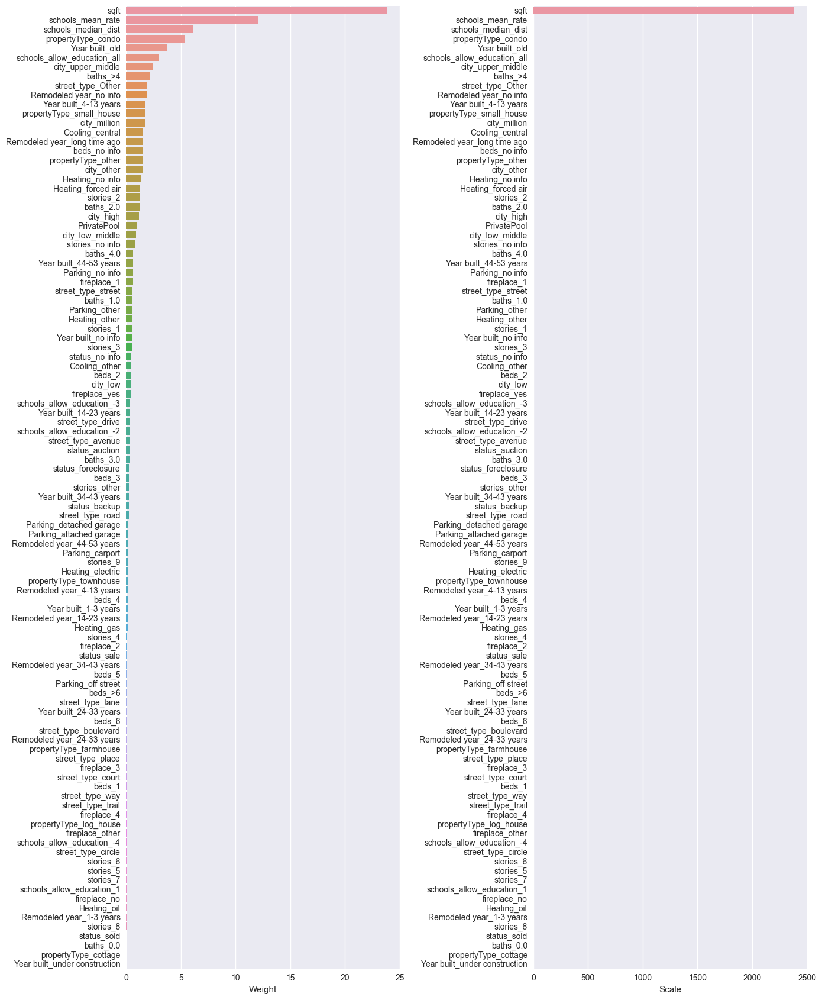

In [83]:
show_weights(X.columns, ctb.feature_importances_, X_train.std())

### Попробуем нормализовать признаки

In [84]:
#Создаем объект для min-max нормализации
scaler = preprocessing.MinMaxScaler()
#Вычисляем параметры для нормализации - min и max для каждого столбца
scaler.fit(X_train)
#Производим преобразование для каждой из выборок
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [85]:
# создадим список для изменений
x_scaled_list = []
x_scaled_list += ['none'] * len(model_name_list) # заполним для предыдущих случаев

In [87]:
%%time

lr = LinearRegression(n_jobs=-1)
lr.fit(X_train_scaled, y_train)

y_train_scaled_pred_lr = lr.predict(X_train_scaled)
y_test_scaled_pred_lr = lr.predict(X_test_scaled)

CPU times: total: 9.08 s
Wall time: 1.13 s


In [88]:
get_metrics(y_train, y_train_scaled_pred_lr, y_test, y_test_scaled_pred_lr)

model_name_list.append('LinearRegression')
model_params_list.append('none')
y_log_list.append('none')
x_scaled_list.append('yes')

Train R2 score: 0.46
Train MAE: 282101.19
Train MAPE: 76.13%

Test R2 score: 0.46
Test MAE: 282904.73
Test MAPE: 76.68%


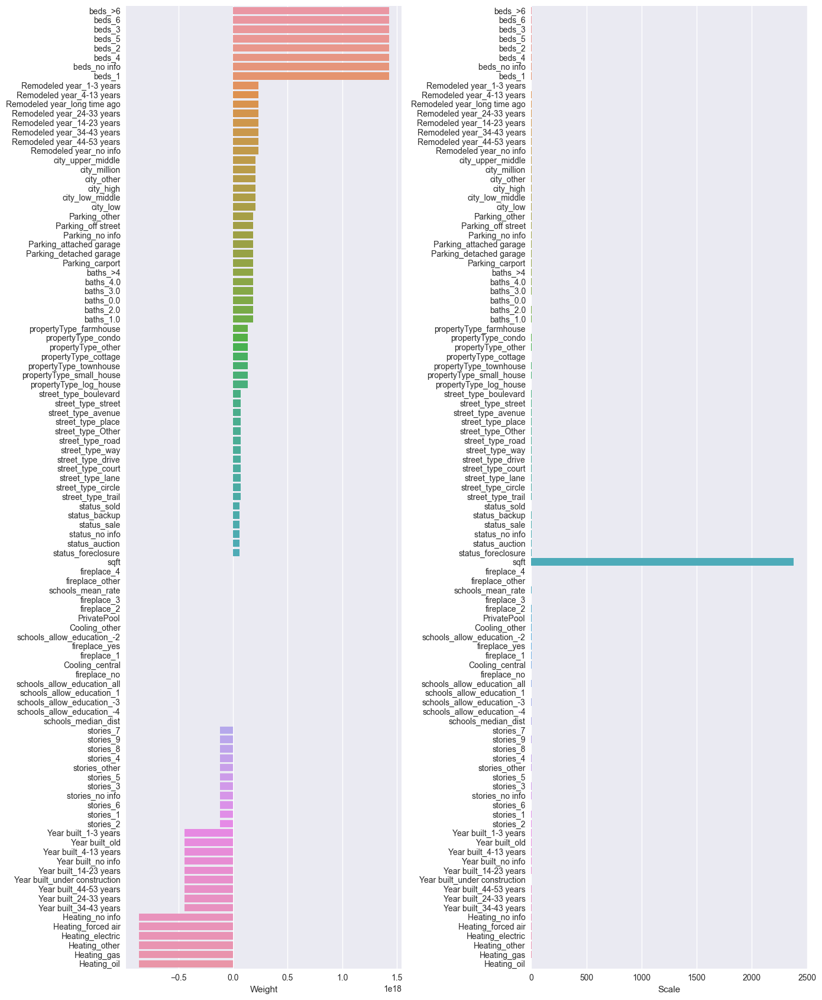

In [89]:
show_weights(X.columns, lr.coef_, X_train.std())

In [90]:
# рассчитаем точность для тестовой выборки
model = RandomForestRegressor(n_estimators=172,
                              max_depth=20, 
                              min_samples_leaf=5, 
                              min_samples_split=11,
                              random_state=random_state)
model.fit(X_train_scaled, y_train)
y_train_scaled_pred_rf = model.predict(X_train_scaled)
y_test_scaled_pred_rf = model.predict(X_test_scaled)

In [91]:
get_metrics(y_train, y_train_scaled_pred_rf, y_test, y_test_scaled_pred_rf)

model_name_list.append('RandomForestRegressor')
model_params_list.append(str({'n_estimators': 172, 'max_depth': 20, 'min_samples_leaf': 5, 'min_samples_split': 11}))
y_log_list.append('none')
x_scaled_list.append('yes')

Train R2 score: 0.83
Train MAE: 145182.95
Train MAPE: 36.48%

Test R2 score: 0.69
Test MAE: 190469.26
Test MAPE: 46.27%


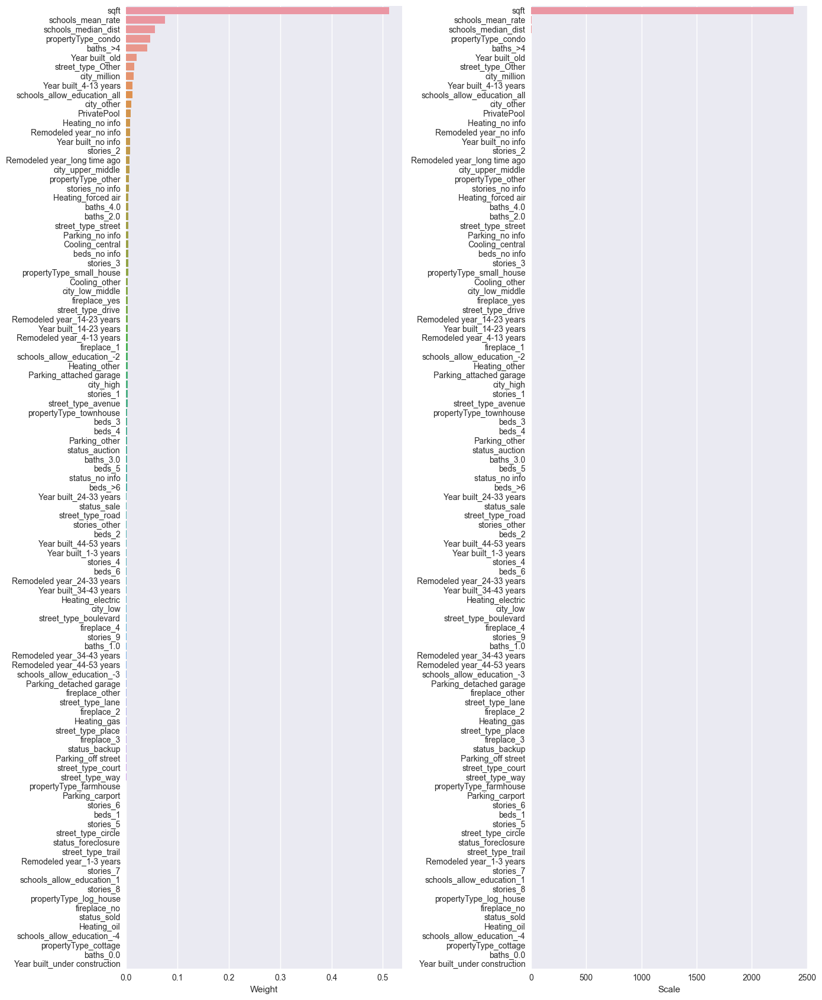

In [92]:
show_weights(X.columns, model.feature_importances_, X_train.std())

In [93]:
# рассчитаем точность для тестовой выборки
model_gb = GradientBoostingRegressor(max_depth=13, 
                                  min_samples_leaf=7, 
                                  min_samples_split=7, 
                                  random_state=random_state)
model_gb.fit(X_train_scaled, y_train)
y_train_scaled_pred_gb = model_gb.predict(X_train_scaled)
y_test_scaled_pred_gb = model.predict(X_test_scaled)

In [94]:
get_metrics(y_train, y_train_scaled_pred_gb, y_test, y_test_scaled_pred_gb)

model_name_list.append('GradientBoostingRegressor')
model_params_list.append(str({'max_depth': 13, 'min_samples_leaf': 7, 'min_samples_split': 7}))
y_log_list.append('none')
x_scaled_list.append('yes')

Train R2 score: 0.90
Train MAE: 124968.84
Train MAPE: 33.47%

Test R2 score: 0.69
Test MAE: 190469.26
Test MAPE: 46.27%


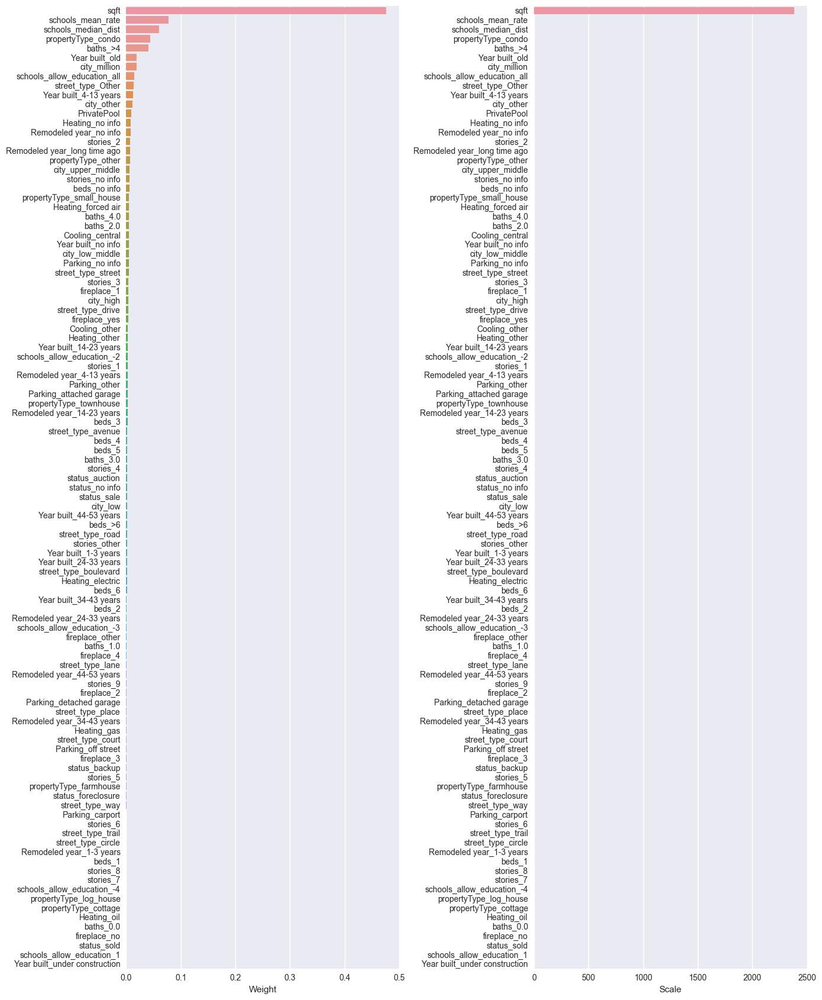

In [95]:
show_weights(X.columns, model_gb.feature_importances_, X_train.std())

In [96]:
%%time

ctb = CatBoostRegressor(iterations=5000,
                          random_seed=random_state,
                          eval_metric='R2',
                          custom_metric=['MAPE', 'MAE'],
                          silent=True,
                         )
ctb.fit(X_train_scaled, y_train,
         eval_set=(X_test_scaled, y_test),
         verbose_eval=0,
         use_best_model=True,
         )

y_train_scaled_pred_ctb = ctb.predict(X_train_scaled)
y_test_scaled_pred_ctb = ctb.predict(X_test_scaled)

CPU times: total: 17min 18s
Wall time: 1min


In [97]:
get_metrics(y_train, y_train_scaled_pred_ctb, y_test, y_test_scaled_pred_ctb)

model_name_list.append('CatBoostRegressor')
model_params_list.append('learning_rate: ' + str(ctb.learning_rate_))
y_log_list.append('none')
x_scaled_list.append('yes')

Train R2 score: 0.80
Train MAE: 171610.26
Train MAPE: 42.85%

Test R2 score: 0.73
Test MAE: 187824.59
Test MAPE: 45.22%


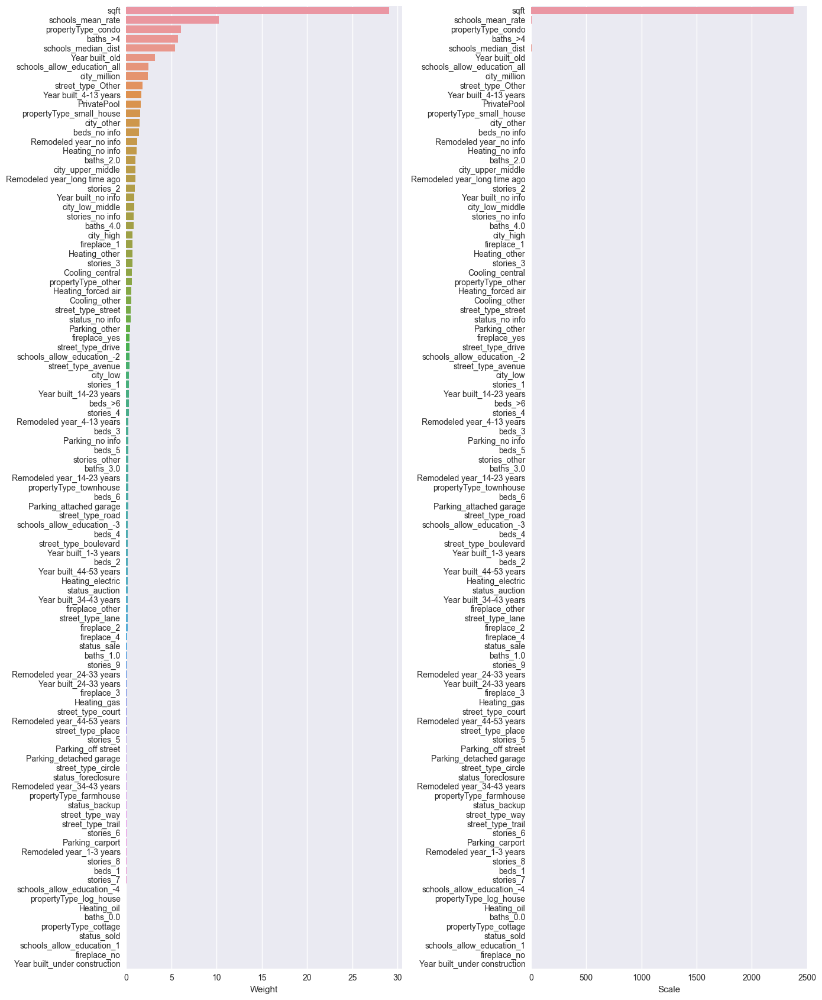

In [98]:
show_weights(X.columns, ctb.feature_importances_, X_train.std())

### Попробуем построить модели на нормализованных признаках с логарифмированием целевого признака

In [99]:
%%time

lr = LinearRegression(n_jobs=-1)
lr.fit(X_train_scaled, y_train_log)

y_train_scaled_log_pred_lr = lr.predict(X_train_scaled)
y_test_scaled_log_pred_lr = lr.predict(X_test_scaled)

CPU times: total: 8.8 s
Wall time: 1.11 s


In [100]:
get_metrics(y_train, np.exp(y_train_scaled_log_pred_lr), y_test, np.exp(y_test_scaled_log_pred_lr))

model_name_list.append('LinearRegression')
model_params_list.append('none')
y_log_list.append('yes')
x_scaled_list.append('yes')

Train R2 score: -3.51
Train MAE: 291718.03
Train MAPE: 56.73%

Test R2 score: -3.69
Test MAE: 292161.54
Test MAPE: 57.05%


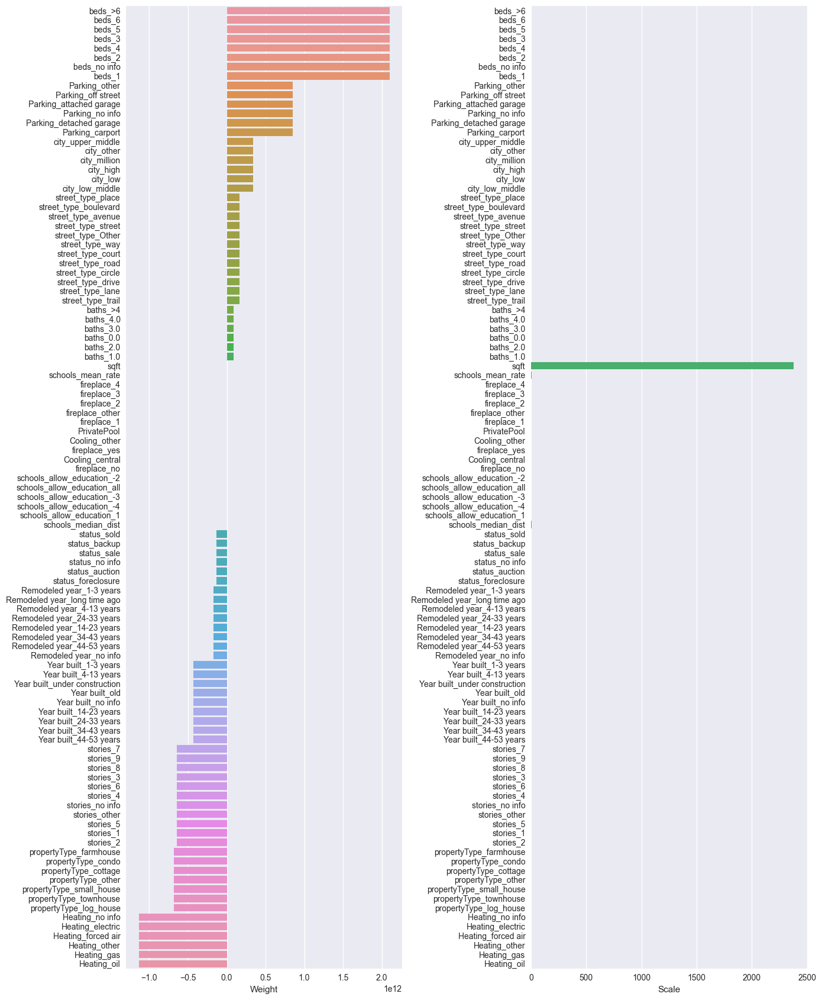

In [101]:
show_weights(X.columns, lr.coef_, X_train.std())

In [102]:
# рассчитаем точность для тестовой выборки
model = RandomForestRegressor(n_estimators=172,
                              max_depth=20, 
                              min_samples_leaf=5, 
                              min_samples_split=11,
                              random_state=random_state)
model.fit(X_train_scaled, y_train_log)
y_train_scaled_log_pred_rf = model.predict(X_train_scaled)
y_test_scaled_log_pred_rf = model.predict(X_test_scaled)

In [103]:
get_metrics(y_train, np.exp(y_train_scaled_log_pred_rf), y_test, np.exp(y_test_scaled_log_pred_rf))

model_name_list.append('RandomForestRegressor')
model_params_list.append(str({'n_estimators': 172, 'max_depth': 20, 'min_samples_leaf': 5, 'min_samples_split': 11}))
y_log_list.append('yes')
x_scaled_list.append('yes')

Train R2 score: 0.78
Train MAE: 140714.18
Train MAPE: 25.90%

Test R2 score: 0.65
Test MAE: 183008.79
Test MAPE: 35.33%


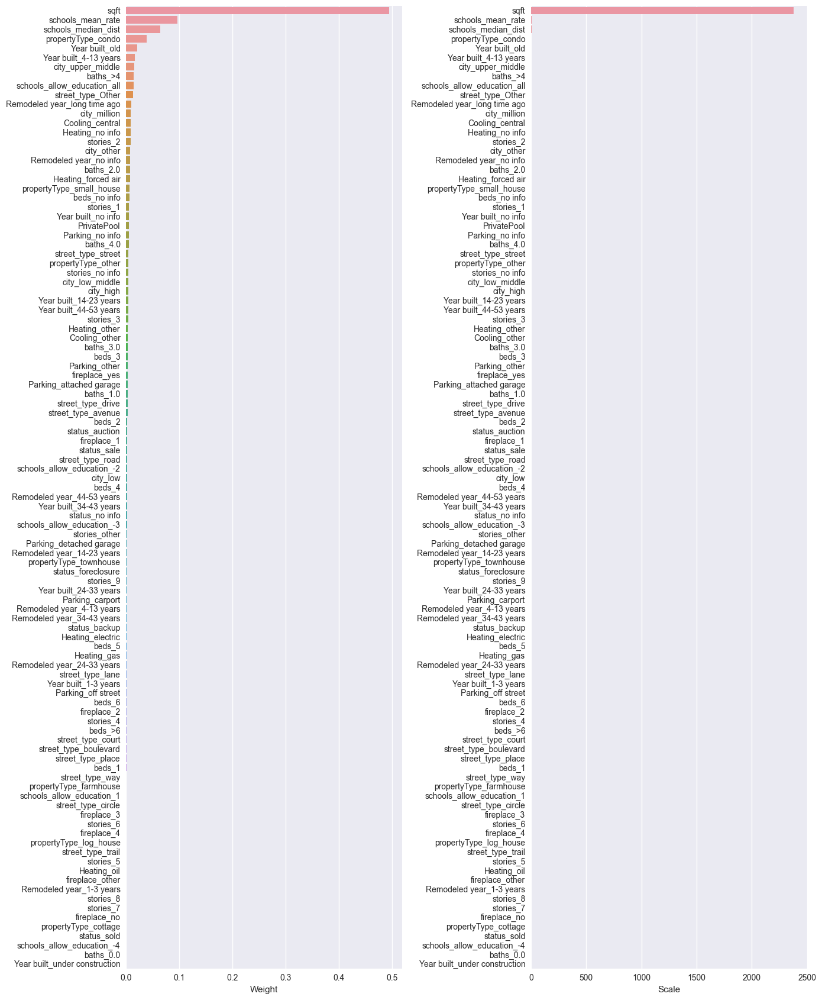

In [104]:
show_weights(X.columns, model.feature_importances_, X_train.std())

In [105]:
# рассчитаем точность для тестовой выборки
model_gb = GradientBoostingRegressor(max_depth=13, 
                                  min_samples_leaf=7, 
                                  min_samples_split=7, 
                                  random_state=random_state)
model_gb.fit(X_train_scaled, y_train_log)
y_train_scaled_log_pred_gb = model_gb.predict(X_train_scaled)
y_test_scaled_log_pred_gb = model.predict(X_test_scaled)

In [106]:
get_metrics(y_train, np.exp(y_train_scaled_log_pred_gb), y_test, np.exp(y_test_scaled_log_pred_gb))

model_name_list.append('GradientBoostingRegressor')
model_params_list.append(str({'max_depth': 13, 'min_samples_leaf': 7, 'min_samples_split': 7}))
y_log_list.append('yes')
x_scaled_list.append('yes')

Train R2 score: 0.85
Train MAE: 122930.48
Train MAPE: 23.57%

Test R2 score: 0.65
Test MAE: 183008.79
Test MAPE: 35.33%


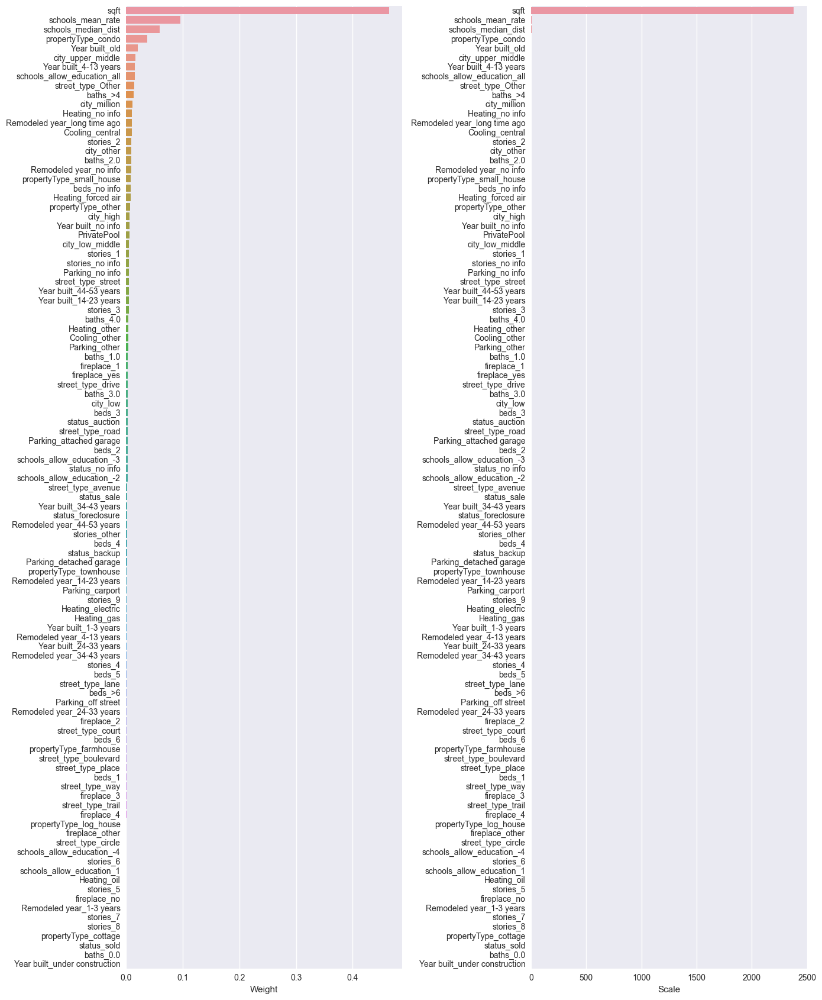

In [107]:
show_weights(X.columns, model_gb.feature_importances_, X_train.std())

In [161]:
%%time

ctb = CatBoostRegressor(iterations=5000,
                          random_seed=random_state,
                          eval_metric='R2',
                          custom_metric=['MAPE', 'MAE'],
                          silent=True,
                         )
ctb.fit(X_train_scaled, y_train_log,
         eval_set=(X_test_scaled, y_test_log),
         verbose_eval=0,
         use_best_model=True,
         )

y_train_scaled_log_pred_ctb = ctb.predict(X_train_scaled)
y_test_scaled_log_pred_ctb = ctb.predict(X_test_scaled)

CPU times: total: 18min 2s
Wall time: 1min 3s


In [109]:
get_metrics(y_train, np.exp(y_train_scaled_log_pred_ctb), y_test, np.exp(y_test_scaled_log_pred_ctb))

model_name_list.append('CatBoostRegressor')
model_params_list.append('learning_rate: ' + str(ctb.learning_rate_))
y_log_list.append('yes')
x_scaled_list.append('yes')

Train R2 score: 0.74
Train MAE: 165422.12
Train MAPE: 30.90%

Test R2 score: 0.70
Test MAE: 175389.76
Test MAPE: 33.08%


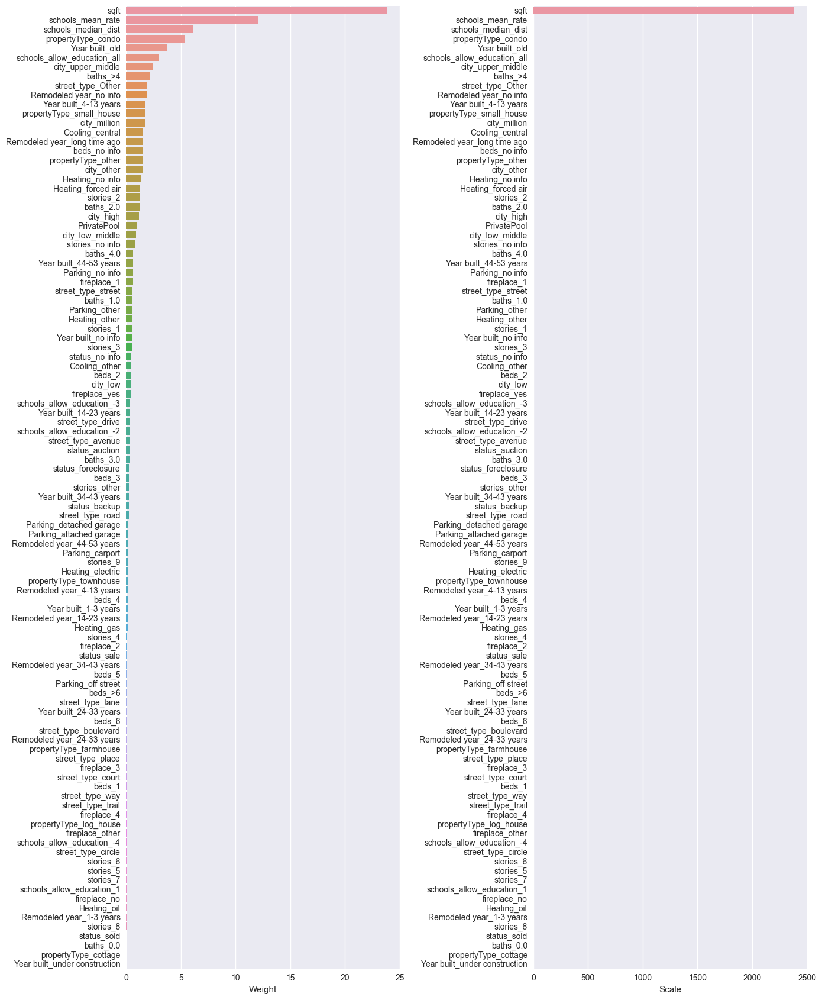

In [110]:
show_weights(X.columns, ctb.feature_importances_, X_train.std())

In [115]:
# посмотрим результаты
result=pd.DataFrame()
result['model_name'] = model_name_list
result['model_params'] = model_params_list
result['y_log'] = y_log_list
result['x_scaled'] = x_scaled_list
result['r2_train'] = np.round(r2_train_list,2)
result['mae_train'] = np.round(mae_train_list,2)
result['mape_train'] = np.round(mape_train_list,2)
result['r2_test'] = np.round(r2_test_list,2)
result['mae_test'] = np.round(mae_test_list,2)
result['mape_test'] = np.round(mape_test_list,2)

result

,model_name,model_params,y_log,x_scaled,r2_train,mae_train,mape_train,r2_test,mae_test,mape_test
0,naive mean,none,none,none,0.00,407523.93,142.31,-0.00,407487.58,143.33
1,LinearRegression,none,none,none,0.46,281941.64,76.04,0.46,282736.49,76.59
2,RandomForestRegressor,none,none,none,0.96,65963.49,15.59,0.72,176281.42,42.03
3,RandomForestRegressor,"{'n_estimators': 180, 'max_depth': 20, 'min_sa...",none,none,0.83,145153.91,36.47,0.69,190427.13,46.26
4,RandomForestRegressor,"{'n_estimators': 150, 'max_depth': 17, 'min_sa...",none,none,0.77,170260.73,43.39,0.68,199368.34,49.36
5,RandomForestRegressor,"{'n_estimators': 200, 'max_depth': 18, 'min_sa...",none,none,0.79,162954.62,41.24,0.68,196268.92,48.24
6,GradientBoostingRegressor,"{'max_depth': 20, 'min_samples_leaf': 5, 'min_...",none,none,0.99,47941.97,13.94,0.68,196268.92,48.24
7,GradientBoostingRegressor,"{'max_depth': 13, 'min_samples_leaf': 7, 'min_...",none,none,0.90,122773.63,32.98,0.68,196268.92,48.24
8,GradientBoostingRegressor,"{'max_depth': 11, 'min_samples_leaf': 8}",none,none,0.85,151671.70,39.64,0.68,196268.92,48.24
9,GradientBoostingRegressor,"{'max_depth': 20, 'min_samples_leaf': 20}",none,none,0.91,110210.10,27.23,0.68,196268.92,48.24


Лучшие результаты получились при логарифмировании целевого признака. При этом нормализация улучшает результат на сотые доли процента. Наилучшая модель - CatBoostRegressor

-------------------
## Попробуем применить отбор параметров

In [126]:
# создадим список для изменений
feature_select_list = []
feature_select_list += ['103'] * len(model_name_list) # заполним для предыдущих случаев

In [116]:
from sklearn.feature_selection import RFE

estimator = CatBoostRegressor()
selector = RFE(estimator, n_features_to_select=50, step=1)
selector = selector.fit(X_train, y_train)
 
selector.get_feature_names_out()

Learning rate set to 0.096672
0:	learn: 680037.6844155	total: 12ms	remaining: 12s
1:	learn: 656469.7076365	total: 23.1ms	remaining: 11.5s
2:	learn: 636273.0234399	total: 34.4ms	remaining: 11.4s
3:	learn: 618527.7012802	total: 45.9ms	remaining: 11.4s
4:	learn: 603129.0616108	total: 57ms	remaining: 11.3s
5:	learn: 589583.9934901	total: 68.2ms	remaining: 11.3s
6:	learn: 577998.6607288	total: 80ms	remaining: 11.4s
7:	learn: 567653.0752211	total: 91.5ms	remaining: 11.3s
8:	learn: 558655.3912174	total: 103ms	remaining: 11.4s
9:	learn: 550971.5422185	total: 114ms	remaining: 11.2s
10:	learn: 544050.9504504	total: 125ms	remaining: 11.3s
11:	learn: 537556.8538031	total: 137ms	remaining: 11.3s
12:	learn: 532150.7385670	total: 149ms	remaining: 11.3s
13:	learn: 527168.1360997	total: 160ms	remaining: 11.3s
14:	learn: 522626.1886863	total: 171ms	remaining: 11.2s
15:	learn: 518611.2721541	total: 182ms	remaining: 11.2s
16:	learn: 514822.5256486	total: 193ms	remaining: 11.2s
17:	learn: 511228.3400735	to

array(['sqft', 'PrivatePool', 'schools_mean_rate', 'schools_median_dist',
       'status_no info', 'status_sale', 'propertyType_condo',
       'propertyType_other', 'propertyType_small_house', 'baths_2.0',
       'baths_4.0', 'baths_>4', 'fireplace_1', 'fireplace_yes',
       'city_high', 'city_low', 'city_low_middle', 'city_million',
       'city_other', 'city_upper_middle', 'beds_3', 'beds_5',
       'beds_no info', 'stories_1', 'stories_2', 'stories_3', 'stories_4',
       'stories_no info', 'street_type_Other', 'street_type_avenue',
       'street_type_drive', 'street_type_street',
       'Year built_14-23 years', 'Year built_4-13 years',
       'Year built_no info', 'Year built_old',
       'Remodeled year_14-23 years', 'Remodeled year_4-13 years',
       'Remodeled year_long time ago', 'Remodeled year_no info',
       'Heating_forced air', 'Heating_no info', 'Heating_other',
       'Cooling_central', 'Cooling_other', 'Parking_attached garage',
       'Parking_no info', 'Parking_o

In [123]:
X_train_top = X_train[list(selector.get_feature_names_out())]
X_test_top = X_test[list(selector.get_feature_names_out())]
print(X_train_top.shape)
print(X_test_top.shape)

(229896, 50)
(98527, 50)


In [124]:
#Создаем объект для min-max нормализации
scaler = preprocessing.MinMaxScaler()
#Вычисляем параметры для нормализации - min и max для каждого столбца
scaler.fit(X_train_top)
#Производим преобразование для каждой из выборок
X_train_top_scaled = scaler.transform(X_train_top)
X_test_top_scaled = scaler.transform(X_test_top)

In [127]:
%%time

lr = LinearRegression(n_jobs=-1)
lr.fit(X_train_top_scaled, y_train_log)

y_train_top_scaled_log_pred_lr = lr.predict(X_train_top_scaled)
y_test_top_scaled_log_pred_lr = lr.predict(X_test_top_scaled)

CPU times: total: 1.19 s
Wall time: 374 ms


In [128]:
get_metrics(y_train, np.exp(y_train_top_scaled_log_pred_lr), y_test, np.exp(y_test_top_scaled_log_pred_lr))

model_name_list.append('LinearRegression')
model_params_list.append('none')
y_log_list.append('yes')
x_scaled_list.append('yes')
feature_select_list.append('50')

Train R2 score: -5.75
Train MAE: 308174.71
Train MAPE: 59.68%

Test R2 score: -6.58
Test MAE: 308421.83
Test MAPE: 59.93%


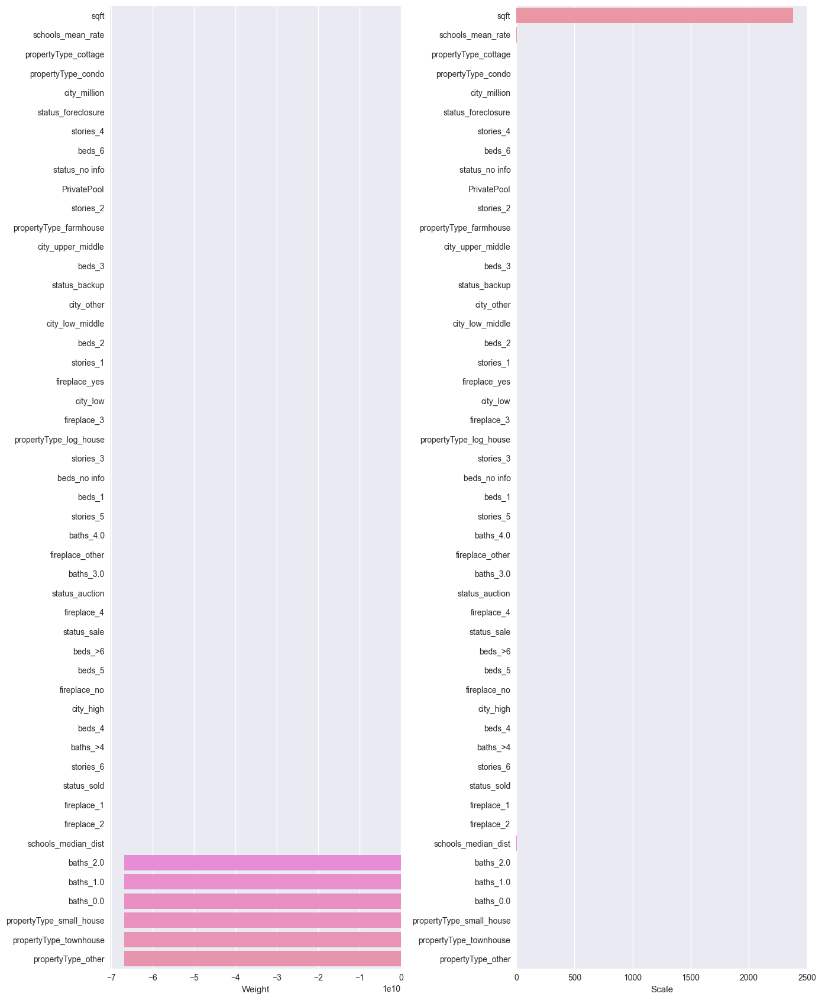

In [129]:
show_weights(X.columns, lr.coef_, X_train.std())

In [130]:
# рассчитаем точность для тестовой выборки
model = RandomForestRegressor(n_estimators=172,
                              max_depth=20, 
                              min_samples_leaf=5, 
                              min_samples_split=11,
                              random_state=random_state)
model.fit(X_train_top_scaled, y_train_log)
y_train_top_scaled_log_pred_rf = model.predict(X_train_top_scaled)
y_test_top_scaled_log_pred_rf = model.predict(X_test_top_scaled)

In [131]:
get_metrics(y_train, np.exp(y_train_top_scaled_log_pred_rf), y_test, np.exp(y_test_top_scaled_log_pred_rf))

model_name_list.append('RandomForestRegressor')
model_params_list.append(str({'n_estimators': 172, 'max_depth': 20, 'min_samples_leaf': 5, 'min_samples_split': 11}))
y_log_list.append('yes')
x_scaled_list.append('yes')
feature_select_list.append('50')

Train R2 score: 0.78
Train MAE: 139928.49
Train MAPE: 25.63%

Test R2 score: 0.65
Test MAE: 183324.92
Test MAPE: 35.40%


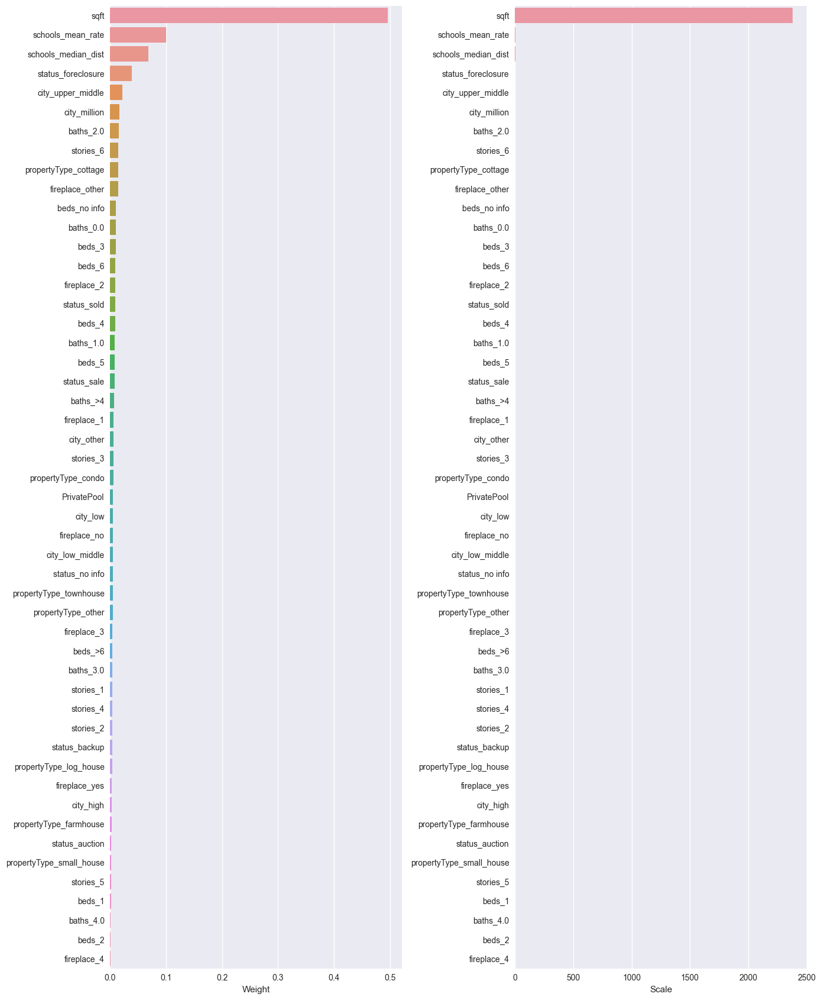

In [132]:
show_weights(X.columns, model.feature_importances_, X_train.std())

In [134]:
# рассчитаем точность для тестовой выборки
model_gb = GradientBoostingRegressor(max_depth=13, 
                                  min_samples_leaf=7, 
                                  min_samples_split=7, 
                                  random_state=random_state)
model_gb.fit(X_train_top_scaled, y_train_log)
y_train_top_scaled_log_pred_gb = model_gb.predict(X_train_top_scaled)
y_test_top_scaled_log_pred_gb = model.predict(X_test_top_scaled)

In [135]:
get_metrics(y_train, np.exp(y_train_top_scaled_log_pred_gb), y_test, np.exp(y_test_top_scaled_log_pred_gb))

model_name_list.append('GradientBoostingRegressor')
model_params_list.append(str({'max_depth': 13, 'min_samples_leaf': 7, 'min_samples_split': 7}))
y_log_list.append('yes')
x_scaled_list.append('yes')
feature_select_list.append('50')

Train R2 score: 0.88
Train MAE: 111678.43
Train MAPE: 21.56%

Test R2 score: 0.65
Test MAE: 183324.92
Test MAPE: 35.40%


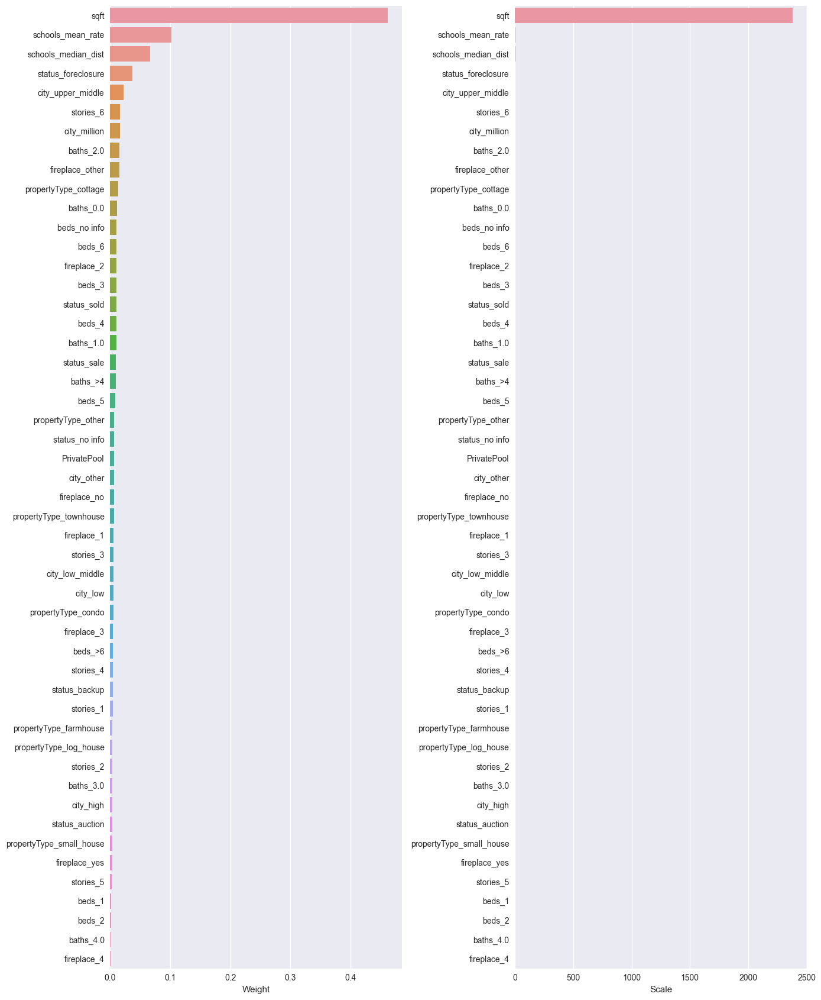

In [136]:
show_weights(X.columns, model_gb.feature_importances_, X_train.std())

In [137]:
%%time

ctb = CatBoostRegressor(iterations=5000,
                          random_seed=random_state,
                          eval_metric='R2',
                          custom_metric=['MAPE', 'MAE'],
                          silent=True,
                         )
ctb.fit(X_train_top_scaled, y_train_log,
         eval_set=(X_test_top_scaled, y_test_log),
         verbose_eval=0,
         use_best_model=True,
         )

y_train_top_scaled_log_pred_ctb = ctb.predict(X_train_top_scaled)
y_test_top_scaled_log_pred_ctb = ctb.predict(X_test_top_scaled)

CPU times: total: 17min 46s
Wall time: 1min 5s


In [138]:
get_metrics(y_train, np.exp(y_train_top_scaled_log_pred_ctb), y_test, np.exp(y_test_top_scaled_log_pred_ctb))

model_name_list.append('CatBoostRegressor')
model_params_list.append('learning_rate: ' + str(ctb.learning_rate_))
y_log_list.append('yes')
x_scaled_list.append('yes')
feature_select_list.append('50')

Train R2 score: 0.74
Train MAE: 165868.23
Train MAPE: 31.29%

Test R2 score: 0.70
Test MAE: 176161.78
Test MAPE: 33.47%


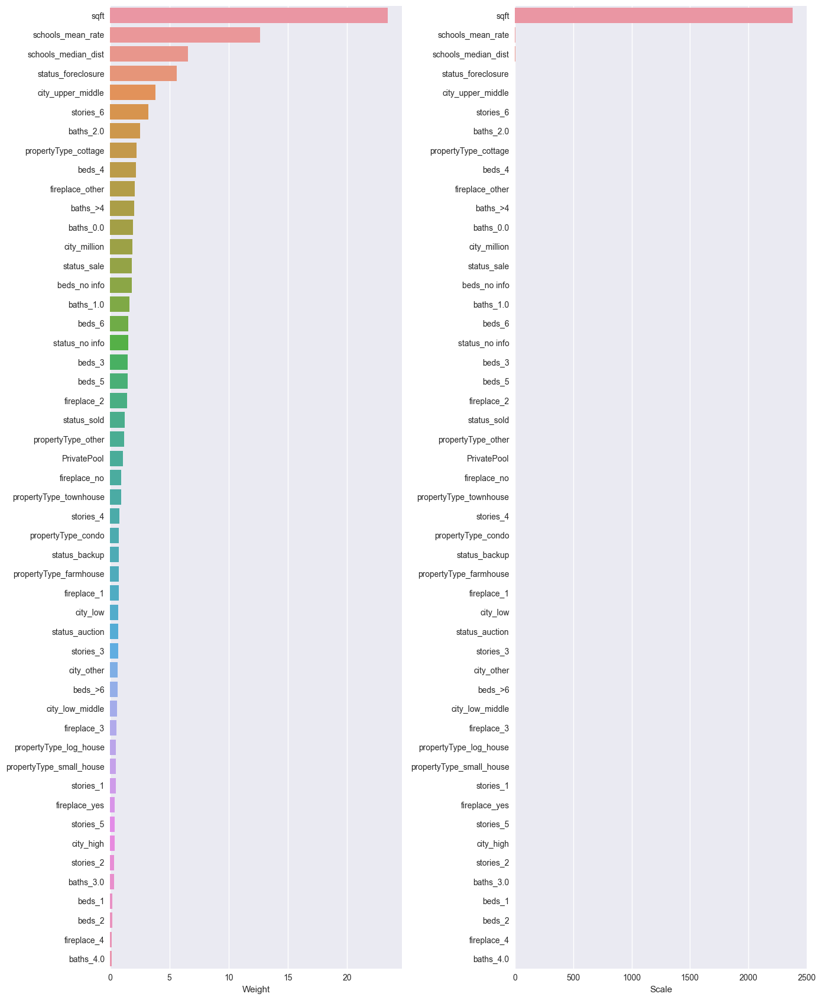

In [139]:
show_weights(X.columns, ctb.feature_importances_, X_train.std())

In [146]:
# посмотрим результаты
result=pd.DataFrame()
result['model_name'] = model_name_list
result['model_params'] = model_params_list
result['y_log'] = y_log_list
result['x_scaled'] = x_scaled_list
result['r2_train'] = np.round(r2_train_list,2)
result['mae_train'] = np.round(mae_train_list,2)
result['mape_train'] = np.round(mape_train_list,2)
result['r2_test'] = np.round(r2_test_list,2)
result['mae_test'] = np.round(mae_test_list,2)
result['mape_test'] = np.round(mape_test_list,2)
result['feature_select'] = feature_select_list

result

,model_name,model_params,y_log,x_scaled,r2_train,mae_train,mape_train,r2_test,mae_test,mape_test,feature_select
0,naive mean,none,none,none,0.00,407523.93,142.31,-0.00,407487.58,143.33,103
1,LinearRegression,none,none,none,0.46,281941.64,76.04,0.46,282736.49,76.59,103
2,RandomForestRegressor,none,none,none,0.96,65963.49,15.59,0.72,176281.42,42.03,103
3,RandomForestRegressor,"{'n_estimators': 180, 'max_depth': 20, 'min_sa...",none,none,0.83,145153.91,36.47,0.69,190427.13,46.26,103
4,RandomForestRegressor,"{'n_estimators': 150, 'max_depth': 17, 'min_sa...",none,none,0.77,170260.73,43.39,0.68,199368.34,49.36,103
5,RandomForestRegressor,"{'n_estimators': 200, 'max_depth': 18, 'min_sa...",none,none,0.79,162954.62,41.24,0.68,196268.92,48.24,103
6,GradientBoostingRegressor,"{'max_depth': 20, 'min_samples_leaf': 5, 'min_...",none,none,0.99,47941.97,13.94,0.68,196268.92,48.24,103
7,GradientBoostingRegressor,"{'max_depth': 13, 'min_samples_leaf': 7, 'min_...",none,none,0.90,122773.63,32.98,0.68,196268.92,48.24,103
8,GradientBoostingRegressor,"{'max_depth': 11, 'min_samples_leaf': 8}",none,none,0.85,151671.70,39.64,0.68,196268.92,48.24,103
9,GradientBoostingRegressor,"{'max_depth': 20, 'min_samples_leaf': 20}",none,none,0.91,110210.10,27.23,0.68,196268.92,48.24,103


Видим, что отбор параметров ухудшает результаты.

# Принимаем решение, что наилучшей оказалась модель CatBoostRegressor с учетом логарифмирования целевого признака и нормализации описательных признаков.

In [162]:
%%time

ctb_best = CatBoostRegressor(iterations=5000,
                             random_seed=random_state,
                             eval_metric='R2',
                             custom_metric=['MAPE', 'MAE'],
                             silent=True
                             )
ctb_best.fit(X_train_scaled, 
             y_train_log,
             eval_set=(X_test_scaled, y_test_log),
             verbose_eval=0,
             use_best_model=True
             )

CPU times: total: 17min 30s
Wall time: 1min 2s


In [165]:
# Производим сериализацию и записываем результат в файл формата pkl
with open('model.pkl', 'wb') as output:
    pickle.dump(ctb_best, output)

In [166]:
# Производим десериализацию и извлекаем модель из файла формата pkl
with open('model.pkl', 'rb') as pkl_file:
    model_from_file = pickle.load(pkl_file)

model_from_file